# ML FINAL PROJECT - CSCE 633

### Team: Server Geeks
#### Developers:
  - Kanishk Chhabra
  - Priyal Khapra
  - Dishant Parag Zaveri




#### Project Video

https://youtu.be/3wKZaCrVRzU

#### Project Drive Link

https://drive.google.com/drive/folders/1HpiZfIM8zOEJv_Lla2E6-5l0BILOdevg?usp=sharing

#### DATA FILES USED IN THIS PROJECT

| **Phase**   | **Files**                  |
|-------------|----------------------------|
| **Training**| `img_train.csv`            |
|             | `demo_viome_train.csv`     |
|             | `cgm_train.csv`            |
| **Testing** | `img_test.csv`             |
|             | `demo_viome_test.csv`      |
|             | `cgm_test.csv`             |


| **Phase**   | **Files**                      |
|-------------|--------------------------------|
| **Training**| `label_train.csv`              |
| **Testing** | `label_test_breakfast_only.csv`|


## Importing datasets

In [ ]:
import pandas as pd

In [ ]:
img_train = pd.read_csv('img_train.csv')
demo_viome_train = pd.read_csv('demo_viome_train.csv')
cmg_train = pd.read_csv('cgm_train.csv')

In [ ]:
label_train = pd.read_csv('label_train.csv')

In [ ]:
label_test = pd.read_csv('label_test_breakfast_only.csv')

In [ ]:
label_train

,Subject ID,Day,Breakfast Calories,Lunch Calories,Breakfast Carbs,Lunch Carbs,Breakfast Fat,Lunch Fat,Breakfast Protein,Lunch Protein
0,1,2,448.0,830,66.0,92,10.5,42.0,22.0,17
1,1,3,608.0,435,66.0,16,10.5,14.0,66.0,66
2,1,4,712.0,555,66.0,94,42.0,13.0,22.0,12
3,1,5,902.0,355,73.0,19,42.0,15.0,66.0,32
4,1,6,268.0,1180,24.0,81,10.5,54.5,22.0,88
...,...,...,...,...,...,...,...,...,...,...
319,7,6,268.0,1180,24.0,81,10.5,54.5,22.0,88
320,7,7,448.0,830,66.0,92,10.5,42.0,22.0,17
321,7,8,608.0,435,66.0,16,10.5,14.0,66.0,66
322,7,9,712.0,555,66.0,94,42.0,13.0,22.0,12


In [ ]:
label_test

,Subject ID,Day,Breakfast Calories,Breakfast Carbs,Breakfast Fat,Breakfast Protein
0,4,2,448.0,66.0,10.5,22.0
1,4,3,608.0,66.0,10.5,66.0
2,4,6,268.0,24.0,10.5,22.0
3,4,7,448.0,66.0,10.5,22.0
4,4,8,608.0,66.0,10.5,66.0
...,...,...,...,...,...,...
68,18,5,902.0,73.0,42.0,66.0
69,18,6,268.0,24.0,10.5,22.0
70,18,7,448.0,66.0,10.5,22.0
71,18,8,608.0,66.0,10.5,66.0


## preprocessing demo_viome data first

In [ ]:
demo_viome_train

,Subject ID,Age,Gender,Weight,Height,Race,Diabetes Status,A1C,Baseline Fasting Glucose,Insulin,Triglycerides,Cholesterol,HDL,Non-HDL,LDL,VLDL,CHO/HDL Ratio,HOMA-IR,BMI,Viome
0,1,27,0,133.8,65.00,Hispanic/Latino,1,5.4,91.0,2.5,67.0,216.0,74.0,142.0,130.000000,13.0,2.900000,0.561728,22.263053,"-11.691621427726268,-7.744787588227839,-7.6142..."
1,2,49,1,169.2,62.00,Hispanic/Latino,1,5.5,93.0,14.8,61.0,181.0,91.0,90.0,78.000000,12.0,2.000000,3.398519,30.943704,"-9.395216776716872,-7.315438412832852,1.103724..."
2,3,59,1,157.0,64.00,Hispanic/Latino,3,6.5,118.0,17.4,154.0,190.0,74.0,116.0,90.000000,31.0,2.600000,5.069630,26.946045,"-11.007947281293239,-8.444134921199856,0.28806..."
3,5,51,1,172.0,62.50,Hispanic/Latino,3,6.6,144.0,12.9,392.0,269.0,38.0,231.0,157.000000,78.0,7.100000,4.586667,30.954496,"-6.21833166351615,-5.868646092839025,-6.612900..."
4,6,51,1,197.0,68.75,White,1,5.2,96.0,6.4,75.0,203.0,72.0,131.0,118.000000,15.0,2.800000,1.517037,29.300575,"-6.7953636871125,-6.50799421035929,-1.85678011..."
5,8,54,0,218.4,62.00,Hispanic/Latino,2,5.8,112.0,17.7,145.0,180.0,60.0,120.0,95.000000,29.0,3.000000,4.894815,39.941519,"-11.032816486894726,-8.496204707916016,0.70214..."
6,9,34,1,183.2,59.00,Hispanic/Latino,2,5.7,122.0,25.7,312.0,202.0,40.0,162.0,108.000000,62.0,5.100000,7.741728,36.997874,"-6.701633651310541,-7.105402741679025,-2.42586..."
7,10,54,1,195.8,62.00,Hispanic/Latino,2,5.7,100.0,15.3,101.0,183.0,55.0,128.0,110.000000,20.0,3.300000,3.777778,35.808377,"-5.1823816084016014,-6.776492838169264,-0.4237..."
8,11,34,0,186.2,67.00,Hispanic/Latino,2,5.7,109.0,11.6,247.0,205.0,36.0,169.0,125.000000,49.0,5.700000,3.121975,29.159857,"-7.15232581624589,-6.6109591139927915,1.797870..."
9,12,52,0,205.0,69.00,Hispanic/Latino,3,7.1,179.0,13.5,1150.0,213.0,24.0,189.0,113.704545,27.5,3.852273,5.966667,30.269901,"-6.355519308437172,-7.353357090027193,1.503528..."


In [ ]:
for i in range(len(demo_viome_train)):
    print(len(demo_viome_train['Viome'][i]))

521
531
523
523
513
525
524
530
515
523
522
526
523
525
523
522
514
527
526
539
522
539
529
533
524
533
535
533
536
533
527
542
528
528
535
523


In [ ]:
import numpy as np

In [ ]:
type(demo_viome_train['Viome'][0])

str

In [ ]:
array_of_means = []
array_of_max = []
array_of_min = []
for i in range(36):
    list1 = demo_viome_train['Viome'][i].split(',')
    random_sum = 0
    random_max = -1000
    random_min = 1000
    for j in list1:
        temp_num = float(j)
        random_sum += temp_num
        if temp_num > random_max:
            random_max = temp_num
        if temp_num < random_min:
            random_min = temp_num
    print('random mean', random_sum/27)
    print('random max',random_max)
    print('random min',random_min)
    array_of_means.append(random_sum/27)
    array_of_max.append(random_max)
    array_of_min.append(random_min)
    print('----------------------')

random mean -0.4851532498971433
random max 6.260431976374428
random min -11.691621427726268
----------------------
random mean -0.49247451632673944
random max 10.507589343545654
random min -9.395216776716872
----------------------
random mean -0.3462573703174148
random max 7.283976031227047
random min -11.007947281293239
----------------------
random mean -1.434091259447813
random max 3.0445131170428024
random min -6.612900218882827
----------------------
random mean -0.5861874540781326
random max 5.815290972067641
random min -6.7953636871125
----------------------
random mean -0.6593902828279284
random max 7.286284561463299
random min -11.032816486894726
----------------------
random mean -1.015268256233079
random max 2.8814605533853754
random min -7.105402741679025
----------------------
random mean -0.531152427491656
random max 5.95557743335996
random min -6.776492838169264
----------------------
random mean 0.014330848929578277
random max 5.61742986067745
random min -7.152325816245

In [ ]:
np_array_of_means = np.array(array_of_means)
np_array_of_max = np.array(array_of_max)
np_array_of_min = np.array(array_of_min)

In [ ]:
# Add aggregate statistics as features
demo_viome_train['Viome_Mean'] = np_array_of_means
demo_viome_train['Viome_Max'] = np_array_of_max
demo_viome_train['Viome_Min'] = np_array_of_min

In [ ]:
demo_viome_train.drop(columns=['Viome'], inplace=True)

In [ ]:
demo_viome_train.columns

Index(['Subject ID', 'Age', 'Gender', 'Weight', 'Height', 'Race',
       'Diabetes Status', 'A1C', 'Baseline Fasting Glucose', 'Insulin',
       'Triglycerides', 'Cholesterol', 'HDL', 'Non-HDL', 'LDL', 'VLDL',
       'CHO/HDL Ratio', 'HOMA-IR', 'BMI', 'Viome_Mean', 'Viome_Max',
       'Viome_Min'],
      dtype='object')

In [ ]:
demo_viome_train['Race'].unique()

array(['Hispanic/Latino', 'White', 'African American'], dtype=object)

In [ ]:
#one hot encoding of the race column
race_encoded = pd.get_dummies(demo_viome_train['Race'], prefix='Race')

In [ ]:
#since there are 3 rows, we can drop one: (0,0) would mean 1 in the third column implictly
race_encoded.drop(columns=['Race_White'], inplace = True)

In [ ]:
race_encoded.head()

,Race_African American,Race_Hispanic/Latino
0,0,1
1,0,1
2,0,1
3,0,1
4,0,0


In [ ]:
demo_viome_train = pd.concat([demo_viome_train, race_encoded], axis=1)

In [ ]:
demo_viome_train = demo_viome_train.drop(columns=['Race'])

In [ ]:
demo_viome_train

,Subject ID,Age,Gender,Weight,Height,Diabetes Status,A1C,Baseline Fasting Glucose,Insulin,Triglycerides,...,LDL,VLDL,CHO/HDL Ratio,HOMA-IR,BMI,Viome_Mean,Viome_Max,Viome_Min,Race_African American,Race_Hispanic/Latino
0,1,27,0,133.8,65.00,1,5.4,91.0,2.5,67.0,...,130.000000,13.0,2.900000,0.561728,22.263053,-0.485153,6.260432,-11.691621,0,1
1,2,49,1,169.2,62.00,1,5.5,93.0,14.8,61.0,...,78.000000,12.0,2.000000,3.398519,30.943704,-0.492475,10.507589,-9.395217,0,1
2,3,59,1,157.0,64.00,3,6.5,118.0,17.4,154.0,...,90.000000,31.0,2.600000,5.069630,26.946045,-0.346257,7.283976,-11.007947,0,1
3,5,51,1,172.0,62.50,3,6.6,144.0,12.9,392.0,...,157.000000,78.0,7.100000,4.586667,30.954496,-1.434091,3.044513,-6.612900,0,1
4,6,51,1,197.0,68.75,1,5.2,96.0,6.4,75.0,...,118.000000,15.0,2.800000,1.517037,29.300575,-0.586187,5.815291,-6.795364,0,0
5,8,54,0,218.4,62.00,2,5.8,112.0,17.7,145.0,...,95.000000,29.0,3.000000,4.894815,39.941519,-0.659390,7.286285,-11.032816,0,1
6,9,34,1,183.2,59.00,2,5.7,122.0,25.7,312.0,...,108.000000,62.0,5.100000,7.741728,36.997874,-1.015268,2.881461,-7.105403,0,1
7,10,54,1,195.8,62.00,2,5.7,100.0,15.3,101.0,...,110.000000,20.0,3.300000,3.777778,35.808377,-0.531152,5.955577,-6.776493,0,1
8,11,34,0,186.2,67.00,2,5.7,109.0,11.6,247.0,...,125.000000,49.0,5.700000,3.121975,29.159857,0.014331,5.617430,-7.152326,0,1
9,12,52,0,205.0,69.00,3,7.1,179.0,13.5,1150.0,...,113.704545,27.5,3.852273,5.966667,30.269901,-0.385864,6.305128,-7.353357,0,1


not scaling the dataframe as of now since there are more columns to be scaled

## Preprocessing Image Data

In [ ]:
import numpy as np
import ast

In [ ]:
img_train

,Subject ID,Day,Image Before Breakfast,Image Before Lunch
0,1,2,"[[[140, 122, 108], [135, 118, 104], [118, 104,...","[[[41, 152, 201], [77, 164, 205], [88, 157, 13..."
1,1,3,"[[[67, 58, 47], [59, 52, 41], [51, 45, 35], [4...","[[[40, 59, 77], [35, 56, 72], [20, 36, 47], [9..."
2,1,4,"[[[199, 195, 193], [198, 193, 192], [196, 192,...","[[[53, 44, 38], [51, 43, 36], [54, 47, 39], [4..."
3,1,5,"[[[149, 121, 80], [157, 128, 86], [159, 130, 8...","[[[30, 28, 28], [20, 18, 17], [31, 27, 23], [2..."
4,1,6,"[[[175, 184, 198], [192, 206, 219], [160, 165,...","[[[74, 85, 100], [59, 69, 81], [73, 84, 96], [..."
...,...,...,...,...
319,7,6,"[[[68, 34, 35], [82, 60, 51], [63, 55, 38], [3...","[[[90, 77, 75], [92, 78, 75], [94, 83, 81], [9..."
320,7,7,"[[[26, 26, 22], [17, 17, 13], [18, 19, 14], [9...","[[[17, 9, 8], [10, 7, 7], [3, 3, 4], [3, 3, 3]..."
321,7,8,"[[[43, 37, 33], [42, 36, 31], [42, 37, 33], [4...","[[[122, 108, 107], [124, 110, 108], [124, 111,..."
322,7,9,"[[[41, 38, 33], [41, 38, 33], [41, 38, 33], [4...","[[[59, 46, 32], [63, 51, 41], [57, 42, 28], [6..."


In [ ]:
type(img_train['Image Before Breakfast'][0])

str

In [ ]:
Image_Before_Breakfast_matrix = []
null_breakfast = []

In [ ]:
for i in range(len(img_train)):
    string_matrix = img_train['Image Before Breakfast'][i] #the values in the column were in the form of a string, storing them in a variable for preprocessing
    parsed_matrix = ast.literal_eval(string_matrix) #the string matrix is converted into matrix (numerical 3d array type)
    matrix_array = np.array(parsed_matrix) #converted into a numpy library
    print(f"Matrix shape: {matrix_array.shape}, index: {i}")
    print(type(matrix_array))
    if matrix_array.shape == (0,):
        null_breakfast.append(i)    #if the shape of the matrix is 0, means it was a null value since it does not contain any values in them. storing the indices with null value into an array
    else:
        Image_Before_Breakfast_matrix.append(matrix_array)

Matrix shape: (64, 64, 3), index: 0
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 1
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 2
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 3
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 4
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 5
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 6
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 7
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 8
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 9
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 10
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 11
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 12
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 13
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 14
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 15
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 

Matrix shape: (64, 64, 3), index: 135
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 136
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 137
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 138
<class 'numpy.ndarray'>
Matrix shape: (0,), index: 139
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 140
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 141
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 142
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 143
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 144
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 145
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 146
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 147
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 148
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 149
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 150
<class 'numpy.ndarray'>
Matrix shape: (

Matrix shape: (64, 64, 3), index: 273
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 274
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 275
<class 'numpy.ndarray'>
Matrix shape: (0,), index: 276
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 277
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 278
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 279
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 280
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 281
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 282
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 283
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 284
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 285
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 286
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 287
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 288
<class 'numpy.ndarray'>
Matrix shape: (

In [ ]:
len(Image_Before_Breakfast_matrix)

310

In [ ]:
len(null_breakfast)

14

In [ ]:
img_train = img_train.drop(null_breakfast)  #dropping the rows containing null values

In [ ]:
img_train = img_train.reset_index(drop=True) #resetting the index

In [ ]:
img_train

,Subject ID,Day,Image Before Breakfast,Image Before Lunch
0,1,2,"[[[140, 122, 108], [135, 118, 104], [118, 104,...","[[[41, 152, 201], [77, 164, 205], [88, 157, 13..."
1,1,3,"[[[67, 58, 47], [59, 52, 41], [51, 45, 35], [4...","[[[40, 59, 77], [35, 56, 72], [20, 36, 47], [9..."
2,1,4,"[[[199, 195, 193], [198, 193, 192], [196, 192,...","[[[53, 44, 38], [51, 43, 36], [54, 47, 39], [4..."
3,1,5,"[[[149, 121, 80], [157, 128, 86], [159, 130, 8...","[[[30, 28, 28], [20, 18, 17], [31, 27, 23], [2..."
4,1,6,"[[[175, 184, 198], [192, 206, 219], [160, 165,...","[[[74, 85, 100], [59, 69, 81], [73, 84, 96], [..."
...,...,...,...,...
305,7,6,"[[[68, 34, 35], [82, 60, 51], [63, 55, 38], [3...","[[[90, 77, 75], [92, 78, 75], [94, 83, 81], [9..."
306,7,7,"[[[26, 26, 22], [17, 17, 13], [18, 19, 14], [9...","[[[17, 9, 8], [10, 7, 7], [3, 3, 4], [3, 3, 3]..."
307,7,8,"[[[43, 37, 33], [42, 36, 31], [42, 37, 33], [4...","[[[122, 108, 107], [124, 110, 108], [124, 111,..."
308,7,9,"[[[41, 38, 33], [41, 38, 33], [41, 38, 33], [4...","[[[59, 46, 32], [63, 51, 41], [57, 42, 28], [6..."


In [ ]:
type(Image_Before_Breakfast_matrix[0])

numpy.ndarray

In [ ]:
Image_Before_Breakfast_matrix[0]

array([[[140, 122, 108],
        [135, 118, 104],
        [118, 104,  90],
        ...,
        [ 17,  26,  24],
        [ 15,  23,  21],
        [  9,  14,  13]],

       [[137, 119, 105],
        [124, 109,  95],
        [112, 102,  89],
        ...,
        [ 19,  26,  25],
        [ 14,  21,  20],
        [ 12,  18,  16]],

       [[130, 113,  99],
        [114, 101,  88],
        [ 89,  92,  83],
        ...,
        [ 12,  18,  18],
        [  9,  15,  15],
        [ 10,  16,  16]],

       ...,

       [[ 81,  54,  50],
        [ 71,  49,  44],
        [ 69,  47,  43],
        ...,
        [169, 124,  98],
        [176, 131, 104],
        [141, 105,  84]],

       [[ 72,  51,  45],
        [ 71,  50,  44],
        [ 73,  52,  47],
        ...,
        [175, 128, 102],
        [177, 132, 105],
        [149, 112,  90]],

       [[ 73,  53,  47],
        [ 72,  51,  46],
        [ 77,  56,  51],
        ...,
        [173, 127, 100],
        [174, 129, 103],
        [157, 118,  94]]

In [ ]:
# import numpy as np
# from tensorflow.keras.applications import ResNet50
# from tensorflow.keras.applications.resnet50 import preprocess_input


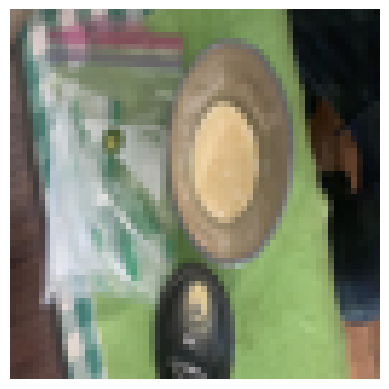

In [ ]:
import matplotlib.pyplot as plt
plt.imshow(Image_Before_Breakfast_matrix[0])
plt.axis('off')  # Turn off axis labels
plt.show()

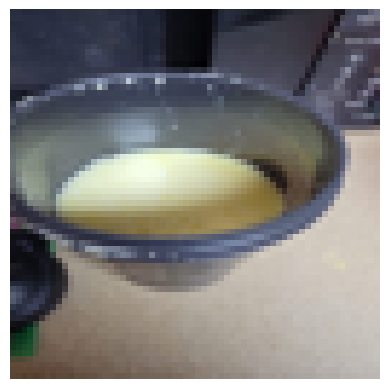

In [ ]:
import matplotlib.pyplot as plt
plt.imshow(Image_Before_Breakfast_matrix[120])
plt.axis('off')  # Turn off axis labels
plt.show()

In [ ]:
import tensorflow as tf
import numpy as np


In [ ]:
Image_Before_Breakfast_matrix

[array([[[140, 122, 108],
         [135, 118, 104],
         [118, 104,  90],
         ...,
         [ 17,  26,  24],
         [ 15,  23,  21],
         [  9,  14,  13]],
 
        [[137, 119, 105],
         [124, 109,  95],
         [112, 102,  89],
         ...,
         [ 19,  26,  25],
         [ 14,  21,  20],
         [ 12,  18,  16]],
 
        [[130, 113,  99],
         [114, 101,  88],
         [ 89,  92,  83],
         ...,
         [ 12,  18,  18],
         [  9,  15,  15],
         [ 10,  16,  16]],
 
        ...,
 
        [[ 81,  54,  50],
         [ 71,  49,  44],
         [ 69,  47,  43],
         ...,
         [169, 124,  98],
         [176, 131, 104],
         [141, 105,  84]],
 
        [[ 72,  51,  45],
         [ 71,  50,  44],
         [ 73,  52,  47],
         ...,
         [175, 128, 102],
         [177, 132, 105],
         [149, 112,  90]],
 
        [[ 73,  53,  47],
         [ 72,  51,  46],
         [ 77,  56,  51],
         ...,
         [173, 127, 100],
  

In [ ]:
Image_Before_Breakfast_matrix[0].shape

(64, 64, 3)

In [ ]:
Image_Before_Breakfast_matrix[1].shape

(64, 64, 3)

In [ ]:
for i in range(len(Image_Before_Breakfast_matrix)):
    print(Image_Before_Breakfast_matrix[1].shape)

(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64,

In [ ]:
Image_Before_Breakfast_matrix

[array([[[140, 122, 108],
         [135, 118, 104],
         [118, 104,  90],
         ...,
         [ 17,  26,  24],
         [ 15,  23,  21],
         [  9,  14,  13]],
 
        [[137, 119, 105],
         [124, 109,  95],
         [112, 102,  89],
         ...,
         [ 19,  26,  25],
         [ 14,  21,  20],
         [ 12,  18,  16]],
 
        [[130, 113,  99],
         [114, 101,  88],
         [ 89,  92,  83],
         ...,
         [ 12,  18,  18],
         [  9,  15,  15],
         [ 10,  16,  16]],
 
        ...,
 
        [[ 81,  54,  50],
         [ 71,  49,  44],
         [ 69,  47,  43],
         ...,
         [169, 124,  98],
         [176, 131, 104],
         [141, 105,  84]],
 
        [[ 72,  51,  45],
         [ 71,  50,  44],
         [ 73,  52,  47],
         ...,
         [175, 128, 102],
         [177, 132, 105],
         [149, 112,  90]],
 
        [[ 73,  53,  47],
         [ 72,  51,  46],
         [ 77,  56,  51],
         ...,
         [173, 127, 100],
  

In [ ]:
# import tensorflow as tf
# from tensorflow.keras.applications import MobileNetV2
# from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
# import numpy as np

# Load MobileNetV2 without the top layer
# model_cnn = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))


In [ ]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.applications.efficientnet import preprocess_input
import numpy as np
import tensorflow as tf
model_cnn = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))


In [ ]:
# from tensorflow.keras.applications import InceptionV3
# model_cnn = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))


In [ ]:
def preprocess_images(images):
    """
    Resize and preprocess images for EfficientNetB0.
    Args:
        images (numpy array): Array of images with shape (num_images, 64, 64, 3).
    Returns:
        Preprocessed images with shape (num_images, 224, 224, 3).
    """
    # Resize images to 224x224 since EfficientNetB0 is trained on images of size 224X224. this would help us get better embeddings
    resized_images = tf.image.resize(images, (224, 224)).numpy()

    # Normalize images using EfficientNetB0's preprocess_input
    preprocessed_images = preprocess_input(resized_images)
    return preprocessed_images


In [ ]:
def extract_embeddings(model, images):
    """
    Extract embeddings from images using a pretrained model.
    Args:
        model: Pretrained model.
        images: Preprocessed images (num_images, 224, 224, 3).
    Returns:
        Embeddings (num_images, flattened_features).
    """
    # Preprocess images
    preprocessed_images = preprocess_images(images)

    # Extract embeddings
    embeddings = model.predict(preprocessed_images)

    # Flatten the embeddings to (num_images, 62720)
    embeddings = embeddings.reshape(embeddings.shape[0], -1)
    return embeddings

In [ ]:
embeddings = extract_embeddings(model_cnn,Image_Before_Breakfast_matrix )

# Check the shape of embeddings
print("Embeddings shape:", embeddings.shape)

10/10 [==============================] - 24s 2s/step
Embeddings shape: (310, 62720)


In [ ]:
embeddings.shape[1]

62720

In [ ]:
# just a check, to see if we did get correct embeddings
# we saw many embeddings values as 0, so to verify i ran this loop
for i in range(embeddings.shape[1]):
    if embeddings[0][i] != 0.0:
        print(embeddings[0][i])
        print(i)

-0.26754114
0
-0.13479577
1
-0.14337413
2
-0.079160444
3
-0.27846375
4
-0.13423625
5
0.3824618
6
-0.23077263
7
-0.27836713
8
-0.2758331
9
-0.19089112
10
-0.10354494
11
-0.19157304
12
-0.2530873
13
-0.18774596
14
-0.066471316
15
-0.15488176
16
-0.12790436
17
-0.12391834
18
-0.17228943
19
0.5629553
20
-0.27460423
21
-0.14807428
22
0.9900877
23
-0.2207162
24
-0.118419334
25
-0.07288422
26
-0.06532551
27
0.4933008
28
0.23674692
29
-0.094926864
30
-0.06550876
31
-0.24749474
32
0.7429465
33
-0.13199832
34
-0.1023009
35
-0.12675285
36
-0.031947844
37
-0.19438928
38
-0.26093227
39
-0.09271426
40
-0.096234836
41
-0.08329136
42
0.26711965
43
-0.17573974
44
-0.06811409
45
-0.21418703
46
-0.18237177
47
-0.22061746
48
-0.05808662
49
0.7482585
50
-0.018564489
51
-0.1112422
52
1.2933344
53
-0.27811953
54
-0.099810235
55
-0.03555079
56
-0.15310058
57
-0.2744948
58
-0.24547698
59
-0.12960115
60
-0.11668411
61
-0.16682811
62
-0.276048
63
-0.016047351
64
-0.2712024
65
-0.12232179
66
-0.14331762
67
0.1243

-0.26402062
9975
-0.19245677
9976
0.26300886
9977
-0.2737102
9978
-0.11694485
9979
-0.27844253
9980
-0.25202617
9981
-0.22561836
9982
-0.26906168
9983
-0.18128893
9984
-0.2769457
9985
-0.2681523
9986
-0.21002866
9987
0.048842687
9988
-0.2595777
9989
-0.22246674
9990
-0.23455602
9991
-0.2779607
9992
0.043727487
9993
-0.25916794
9994
-0.27074328
9995
-0.25569072
9996
-0.15284362
9997
0.32685196
9998
-0.27846423
9999
0.21953231
10000
-0.19355832
10001
-0.24525273
10002
2.209106
10003
-0.27386343
10004
-0.07702207
10005
-0.035519574
10006
-0.09053806
10007
-0.25280195
10008
-0.24141979
10009
-0.17382278
10010
-0.09726619
10011
-0.12408396
10012
-0.22747694
10013
-0.064746276
10014
0.106276095
10015
-0.074453525
10016
0.10170573
10017
-0.25853235
10018
-0.054369222
10019
-0.2783636
10020
-0.26951736
10021
-0.14761965
10022
-0.24077676
10023
-0.046712507
10024
-0.09398875
10025
-0.2328415
10026
-0.122165635
10027
-0.26372436
10028
-0.27839267
10029
-0.13690601
10030
-0.063627385
10031
-0.218

-0.21963818
20667
-0.2502299
20668
0.13259391
20669
0.09965369
20670
-0.27597272
20671
-0.11881931
20672
-0.10334999
20673
-0.11854561
20674
-0.16432253
20675
-0.10870452
20676
-0.26742023
20677
-0.19080065
20678
0.90455747
20679
0.3051198
20680
0.52097344
20681
-0.010000962
20682
-0.22346883
20683
-0.27781355
20684
-0.21035986
20685
-0.2722614
20686
-0.19905306
20687
-0.14520286
20688
-0.27645782
20689
-0.03217816
20690
-0.055108603
20691
-0.076556824
20692
-0.2753421
20693
-0.2784585
20694
-0.2279874
20695
-0.059884347
20696
-0.25682694
20697
-0.16637377
20698
-0.15729852
20699
3.4505699
20700
-0.22999266
20701
-0.2648796
20702
-0.14636752
20703
0.43208194
20704
-0.23814604
20705
-0.15621492
20706
-0.18880059
20707
0.38337716
20708
-0.26837763
20709
-0.2535065
20710
-0.0766448
20711
-0.030052323
20712
-0.21160759
20713
-0.2045381
20714
-0.24989659
20715
-0.2693992
20716
-0.123026244
20717
-0.17955883
20718
-0.067087986
20719
-0.18666941
20720
-0.18001898
20721
-0.27252752
20722
-0.26

-0.23766078
30195
-0.06154036
30196
0.48661953
30197
0.2803373
30198
-0.22507995
30199
-0.12765582
30200
-0.27759534
30201
-0.11228395
30202
-0.27050796
30203
1.0287045
30204
0.8676866
30205
0.09659263
30206
-0.27531463
30207
-0.13467227
30208
-0.13927788
30209
0.5562629
30210
-0.25270608
30211
-0.10870004
30212
-0.10774812
30213
-0.2497629
30214
-0.024214149
30215
-0.018610539
30216
-0.15797167
30217
-0.19174817
30218
-0.09211065
30219
-0.09213245
30220
-0.14331734
30221
-0.23617023
30222
-0.1254905
30223
-0.20892459
30224
-0.08142318
30225
-0.1536721
30226
1.5332272
30227
-0.27796102
30228
-0.27557278
30229
0.54086715
30230
-0.2724573
30231
-0.0060442747
30232
-0.15401372
30233
-0.22482145
30234
1.7260531
30235
-0.26605526
30236
-0.27725998
30237
0.23342396
30238
1.4987847
30239
-0.27044532
30240
-0.26828653
30241
0.10152959
30242
-0.044122268
30243
-0.13525209
30244
-0.07855602
30245
-0.19846073
30246
-0.21136762
30247
-0.22913724
30248
-0.19676057
30249
-0.25763288
30250
-0.2559409

4.3439755
40374
2.007622
40375
-0.06311101
40376
1.4927298
40377
0.8490745
40378
-0.21466506
40379
1.3464323
40380
-0.007515799
40381
3.1316824
40382
-0.06958148
40383
1.145486
40384
0.5265036
40385
3.1235626
40386
-0.1073209
40387
-0.2431505
40388
-0.07175445
40389
-0.009223794
40390
-0.26577917
40391
-0.18733095
40392
-0.15245034
40393
1.0698335
40394
-0.2110483
40395
-0.19086419
40396
-0.12594585
40397
-0.14730833
40398
2.6598716
40399
-0.073124416
40400
-0.07081021
40401
3.1819623
40402
-0.120597124
40403
-0.00041470103
40404
-0.07985644
40405
-0.111839406
40406
-0.21578483
40407
-0.26600656
40408
0.33651266
40409
-0.2762281
40410
-0.1638995
40411
-0.17524952
40412
-0.12647398
40413
-0.15082557
40414
-0.19718277
40415
-0.2673226
40416
-0.010512967
40417
1.2932487
40418
-0.27844253
40419
-0.19135225
40420
-0.011893335
40421
-0.108171195
40422
3.8243256
40423
0.5908192
40424
-0.2468563
40425
-0.095415846
40426
2.0022283
40427
-0.20819162
40428
5.123268
40429
-0.011787421
40430
-0.273

0.6136049
43755
0.0004364963
43756
1.711388
43757
-0.2715474
43758
-0.11573539
43759
-0.24397115
43760
0.007033617
43761
-0.084509954
43762
0.6425037
43763
0.83974206
43764
1.5578042
43765
-0.18945237
43766
-0.25780237
43767
-0.24403197
43768
2.2815714
43769
3.0773575
43770
-0.055198368
43771
-0.067706026
43772
0.120075986
43773
0.2797619
43774
-0.1330451
43775
-0.13081779
43776
-0.21818489
43777
0.8076588
43778
-0.27101994
43779
-0.15901464
43780
0.9233268
43781
-0.22813357
43782
-0.21750128
43783
-0.058061812
43784
-0.00032849243
43785
-0.010225007
43786
-0.27843848
43787
0.13757126
43788
1.9506859
43789
0.7943774
43790
-0.26597103
43791
-0.269816
43792
-0.01870155
43793
0.5364372
43794
-0.2185502
43795
-0.23229694
43796
-0.25247678
43797
-0.11457018
43798
-0.1429301
43799
-0.062068827
43800
-0.07768187
43801
0.06927568
43802
-0.10234357
43803
-0.18333393
43804
-0.26311955
43805
-0.07590275
43806
2.417221
43807
-0.12922584
43808
-0.22112688
43809
-0.21154407
43810
1.7740374
43811
-0.

-0.2084143
54812
-0.26726523
54813
-0.21004292
54814
-0.26740596
54815
-0.21501513
54816
-0.047816437
54817
-0.19635561
54818
-0.14640597
54819
-0.16081956
54820
-0.27790073
54821
-0.24131688
54822
-0.12412548
54823
-0.25201482
54824
0.23114243
54825
-0.16591743
54826
-0.2644919
54827
-0.22291756
54828
-0.27761683
54829
-0.09195198
54830
-0.098304436
54831
-0.15669449
54832
0.57226217
54833
-0.24131112
54834
-0.12642583
54835
-0.27791467
54836
-0.1455952
54837
-0.16857305
54838
-0.19833443
54839
-0.26574856
54840
-0.27707526
54841
-0.24406368
54842
-0.19073024
54843
-0.24075662
54844
-0.24345544
54845
-0.25518417
54846
-0.2654361
54847
-0.261568
54848
-0.19437598
54849
-0.039707582
54850
-0.112252876
54851
0.20253463
54852
-0.055603076
54853
-0.17090933
54854
-0.2016337
54855
-0.14465424
54856
-0.18771559
54857
-0.2776714
54858
0.0029689674
54859
0.36617148
54860
-0.278368
54861
-0.19420134
54862
-0.24275771
54863
-0.1746566
54864
-0.27588663
54865
-0.21990754
54866
-0.21792114
54867
-

In [ ]:
from sklearn.decomposition import PCA

def reduce_features_with_pca(embeddings, n_components=50):
    """
    Reduce dimensionality with PCA.
    Args:
        embeddings (numpy array): High-dimensional embeddings (num_samples, num_features).
        n_components (int): Number of principal components to retain.
    Returns:
        Reduced embeddings.
    """
    pca = PCA(n_components=n_components)
    reduced_embeddings = pca.fit_transform(embeddings)
    return reduced_embeddings, pca.explained_variance_ratio_


In [ ]:
from sklearn.feature_selection import VarianceThreshold

# Apply Variance Threshold
def reduce_features_with_variance_threshold(reduced_embeddings, threshold=0.01):
    """
    Reduce dimensionality by keeping features with variance above the threshold.
    Args:
        embeddings (numpy array): High-dimensional embeddings (num_samples, num_features).
        threshold (float): Minimum variance required to retain a feature.
    Returns:
        Reduced embeddings.
    """
    selector = VarianceThreshold(threshold=threshold)
    reduced_embeddings = selector.fit_transform(embeddings)
    return reduced_embeddings

In [ ]:
# Step 1: Variance Threshold
reduced_embeddings_variance = reduce_features_with_variance_threshold(embeddings, threshold=0.01)

# Step 2: PCA
reduced_embeddings_pca, _ = reduce_features_with_pca(reduced_embeddings_variance, n_components=10)

print("Final reduced embeddings shape:", reduced_embeddings_pca.shape)


Final reduced embeddings shape: (310, 10)


In [ ]:
reduced_embeddings_pca

array([[ 14.595303 ,   9.711539 ,  24.408195 , ...,  45.451473 ,
        -26.118355 ,   2.8486128],
       [ 14.962088 ,  14.032355 ,  27.59644  , ...,  46.90255  ,
        -36.52823  ,  15.0895605],
       [ 27.24036  ,   1.9380592,  15.733176 , ...,  32.150055 ,
         -9.440815 ,   6.4819145],
       ...,
       [-68.27712  ,  30.112703 ,  20.954138 , ..., -33.60764  ,
         -5.283403 ,  -1.4962205],
       [ -5.4953933,  25.849272 ,  20.579163 , ...,  10.137451 ,
        -12.383537 , -17.577732 ],
       [-67.80623  ,  46.79751  ,  51.609127 , ..., -26.644863 ,
         14.989079 , -42.302433 ]], dtype=float32)

In [ ]:
img_train

,Subject ID,Day,Image Before Breakfast,Image Before Lunch
0,1,2,"[[[140, 122, 108], [135, 118, 104], [118, 104,...","[[[41, 152, 201], [77, 164, 205], [88, 157, 13..."
1,1,3,"[[[67, 58, 47], [59, 52, 41], [51, 45, 35], [4...","[[[40, 59, 77], [35, 56, 72], [20, 36, 47], [9..."
2,1,4,"[[[199, 195, 193], [198, 193, 192], [196, 192,...","[[[53, 44, 38], [51, 43, 36], [54, 47, 39], [4..."
3,1,5,"[[[149, 121, 80], [157, 128, 86], [159, 130, 8...","[[[30, 28, 28], [20, 18, 17], [31, 27, 23], [2..."
4,1,6,"[[[175, 184, 198], [192, 206, 219], [160, 165,...","[[[74, 85, 100], [59, 69, 81], [73, 84, 96], [..."
...,...,...,...,...
305,7,6,"[[[68, 34, 35], [82, 60, 51], [63, 55, 38], [3...","[[[90, 77, 75], [92, 78, 75], [94, 83, 81], [9..."
306,7,7,"[[[26, 26, 22], [17, 17, 13], [18, 19, 14], [9...","[[[17, 9, 8], [10, 7, 7], [3, 3, 4], [3, 3, 3]..."
307,7,8,"[[[43, 37, 33], [42, 36, 31], [42, 37, 33], [4...","[[[122, 108, 107], [124, 110, 108], [124, 111,..."
308,7,9,"[[[41, 38, 33], [41, 38, 33], [41, 38, 33], [4...","[[[59, 46, 32], [63, 51, 41], [57, 42, 28], [6..."


In [ ]:
import pandas as pd

print(reduced_embeddings_pca.shape)  # Output: (310, 10)

# Step 1: Converting embeddings to a DataFrame
embeddings_df = pd.DataFrame(
    reduced_embeddings_pca,
    columns=[f"breakfast_embedding_{i+1}" for i in range(reduced_embeddings_pca.shape[1])]
)


img_train = img_train.reset_index(drop=True)  # Reset index if needed

# Step 2: Add embeddings to the original DataFrame
img_train = pd.concat([img_train, embeddings_df], axis=1)


print(img_train.head())


(310, 10)
   Subject ID  Day                             Image Before Breakfast  \
0           1    2  [[[140, 122, 108], [135, 118, 104], [118, 104,...   
1           1    3  [[[67, 58, 47], [59, 52, 41], [51, 45, 35], [4...   
2           1    4  [[[199, 195, 193], [198, 193, 192], [196, 192,...   
3           1    5  [[[149, 121, 80], [157, 128, 86], [159, 130, 8...   
4           1    6  [[[175, 184, 198], [192, 206, 219], [160, 165,...   

                                  Image Before Lunch  breakfast_embedding_1  \
0  [[[41, 152, 201], [77, 164, 205], [88, 157, 13...              14.595303   
1  [[[40, 59, 77], [35, 56, 72], [20, 36, 47], [9...              14.962088   
2  [[[53, 44, 38], [51, 43, 36], [54, 47, 39], [4...              27.240360   
3  [[[30, 28, 28], [20, 18, 17], [31, 27, 23], [2...               2.828344   
4  [[[74, 85, 100], [59, 69, 81], [73, 84, 96], [...              10.637798   

   breakfast_embedding_2  breakfast_embedding_3  breakfast_embedding_4  \
0 

In [ ]:
img_train.head(5)

,Subject ID,Day,Image Before Breakfast,Image Before Lunch,breakfast_embedding_1,breakfast_embedding_2,breakfast_embedding_3,breakfast_embedding_4,breakfast_embedding_5,breakfast_embedding_6,breakfast_embedding_7,breakfast_embedding_8,breakfast_embedding_9,breakfast_embedding_10
0,1,2,"[[[140, 122, 108], [135, 118, 104], [118, 104,...","[[[41, 152, 201], [77, 164, 205], [88, 157, 13...",14.595303,9.711539,24.408195,-28.496742,-60.528652,-33.240074,-3.438794,45.451473,-26.118355,2.848613
1,1,3,"[[[67, 58, 47], [59, 52, 41], [51, 45, 35], [4...","[[[40, 59, 77], [35, 56, 72], [20, 36, 47], [9...",14.962088,14.032355,27.596439,-7.846168,-50.742630,-36.120773,10.864895,46.902550,-36.528229,15.089561
2,1,4,"[[[199, 195, 193], [198, 193, 192], [196, 192,...","[[[53, 44, 38], [51, 43, 36], [54, 47, 39], [4...",27.240360,1.938059,15.733176,-17.733454,-58.939945,-12.382165,2.228206,32.150055,-9.440815,6.481915
3,1,5,"[[[149, 121, 80], [157, 128, 86], [159, 130, 8...","[[[30, 28, 28], [20, 18, 17], [31, 27, 23], [2...",2.828344,45.671379,37.204201,-32.163303,-38.964317,-35.092018,17.037752,30.482935,-17.100504,3.413669
4,1,6,"[[[175, 184, 198], [192, 206, 219], [160, 165,...","[[[74, 85, 100], [59, 69, 81], [73, 84, 96], [...",10.637798,5.100903,52.440945,-43.723026,-29.268679,-23.723114,-4.925167,30.506346,-33.819508,11.651045


In [ ]:
img_train.drop(columns=['Image Before Breakfast'], inplace = True)

In [ ]:
img_train

,Subject ID,Day,Image Before Lunch,breakfast_embedding_1,breakfast_embedding_2,breakfast_embedding_3,breakfast_embedding_4,breakfast_embedding_5,breakfast_embedding_6,breakfast_embedding_7,breakfast_embedding_8,breakfast_embedding_9,breakfast_embedding_10
0,1,2,"[[[41, 152, 201], [77, 164, 205], [88, 157, 13...",14.595303,9.711539,24.408195,-28.496742,-60.528652,-33.240074,-3.438794,45.451473,-26.118355,2.848613
1,1,3,"[[[40, 59, 77], [35, 56, 72], [20, 36, 47], [9...",14.962088,14.032355,27.596439,-7.846168,-50.742630,-36.120773,10.864895,46.902550,-36.528229,15.089561
2,1,4,"[[[53, 44, 38], [51, 43, 36], [54, 47, 39], [4...",27.240360,1.938059,15.733176,-17.733454,-58.939945,-12.382165,2.228206,32.150055,-9.440815,6.481915
3,1,5,"[[[30, 28, 28], [20, 18, 17], [31, 27, 23], [2...",2.828344,45.671379,37.204201,-32.163303,-38.964317,-35.092018,17.037752,30.482935,-17.100504,3.413669
4,1,6,"[[[74, 85, 100], [59, 69, 81], [73, 84, 96], [...",10.637798,5.100903,52.440945,-43.723026,-29.268679,-23.723114,-4.925167,30.506346,-33.819508,11.651045
...,...,...,...,...,...,...,...,...,...,...,...,...,...
305,7,6,"[[[90, 77, 75], [92, 78, 75], [94, 83, 81], [9...",-53.697845,29.236641,24.110010,-1.657203,12.151971,-15.557436,-2.560215,-0.320147,-8.313362,-34.524723
306,7,7,"[[[17, 9, 8], [10, 7, 7], [3, 3, 4], [3, 3, 3]...",-35.233875,-78.793480,88.471390,9.085238,-9.932922,-27.517046,-17.449505,-16.469027,26.800917,5.503268
307,7,8,"[[[122, 108, 107], [124, 110, 108], [124, 111,...",-68.277122,30.112703,20.954138,41.326340,-13.278722,-5.529571,-29.997662,-33.607639,-5.283403,-1.496220
308,7,9,"[[[59, 46, 32], [63, 51, 41], [57, 42, 28], [6...",-5.495393,25.849272,20.579163,-17.611774,-18.953506,-23.817455,-30.997299,10.137451,-12.383537,-17.577732


In [ ]:
Image_Before_Lunch_matrix = []
null_lunch = []

In [ ]:
for i in range(len(img_train)):
    string_matrix = img_train['Image Before Lunch'][i]
    parsed_matrix = ast.literal_eval(string_matrix)
    matrix_array = np.array(parsed_matrix)
    print(f"Matrix shape: {matrix_array.shape}, index: {i}")
    print(type(matrix_array))
    if matrix_array.shape == (0,):
        null_lunch.append(i)
    else:
        Image_Before_Lunch_matrix.append(matrix_array)

Matrix shape: (64, 64, 3), index: 0
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 1
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 2
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 3
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 4
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 5
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 6
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 7
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 8
<class 'numpy.ndarray'>
Matrix shape: (0,), index: 9
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 10
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 11
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 12
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 13
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 14
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 15
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 16
<cla

Matrix shape: (64, 64, 3), index: 135
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 136
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 137
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 138
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 139
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 140
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 141
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 142
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 143
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 144
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 145
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 146
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 147
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 148
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 149
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 150
<class 'numpy.ndarray'>
Matrix s

Matrix shape: (64, 64, 3), index: 271
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 272
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 273
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 274
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 275
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 276
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 277
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 278
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 279
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 280
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 281
<class 'numpy.ndarray'>
Matrix shape: (0,), index: 282
<class 'numpy.ndarray'>
Matrix shape: (0,), index: 283
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 284
<class 'numpy.ndarray'>
Matrix shape: (0,), index: 285
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 286
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), in

In [ ]:
len(Image_Before_Lunch_matrix)

291

In [ ]:
len(null_lunch)

19

In [ ]:
img_train = img_train.drop(null_lunch)

In [ ]:
img_train = img_train.reset_index(drop=True)

In [ ]:
img_train

,Subject ID,Day,Image Before Lunch,breakfast_embedding_1,breakfast_embedding_2,breakfast_embedding_3,breakfast_embedding_4,breakfast_embedding_5,breakfast_embedding_6,breakfast_embedding_7,breakfast_embedding_8,breakfast_embedding_9,breakfast_embedding_10
0,1,2,"[[[41, 152, 201], [77, 164, 205], [88, 157, 13...",14.595303,9.711539,24.408195,-28.496742,-60.528652,-33.240074,-3.438794,45.451473,-26.118355,2.848613
1,1,3,"[[[40, 59, 77], [35, 56, 72], [20, 36, 47], [9...",14.962088,14.032355,27.596439,-7.846168,-50.742630,-36.120773,10.864895,46.902550,-36.528229,15.089561
2,1,4,"[[[53, 44, 38], [51, 43, 36], [54, 47, 39], [4...",27.240360,1.938059,15.733176,-17.733454,-58.939945,-12.382165,2.228206,32.150055,-9.440815,6.481915
3,1,5,"[[[30, 28, 28], [20, 18, 17], [31, 27, 23], [2...",2.828344,45.671379,37.204201,-32.163303,-38.964317,-35.092018,17.037752,30.482935,-17.100504,3.413669
4,1,6,"[[[74, 85, 100], [59, 69, 81], [73, 84, 96], [...",10.637798,5.100903,52.440945,-43.723026,-29.268679,-23.723114,-4.925167,30.506346,-33.819508,11.651045
...,...,...,...,...,...,...,...,...,...,...,...,...,...
286,7,6,"[[[90, 77, 75], [92, 78, 75], [94, 83, 81], [9...",-53.697845,29.236641,24.110010,-1.657203,12.151971,-15.557436,-2.560215,-0.320147,-8.313362,-34.524723
287,7,7,"[[[17, 9, 8], [10, 7, 7], [3, 3, 4], [3, 3, 3]...",-35.233875,-78.793480,88.471390,9.085238,-9.932922,-27.517046,-17.449505,-16.469027,26.800917,5.503268
288,7,8,"[[[122, 108, 107], [124, 110, 108], [124, 111,...",-68.277122,30.112703,20.954138,41.326340,-13.278722,-5.529571,-29.997662,-33.607639,-5.283403,-1.496220
289,7,9,"[[[59, 46, 32], [63, 51, 41], [57, 42, 28], [6...",-5.495393,25.849272,20.579163,-17.611774,-18.953506,-23.817455,-30.997299,10.137451,-12.383537,-17.577732


In [ ]:
embeddings = extract_embeddings(model_cnn,Image_Before_Lunch_matrix )


# Check the shape of embeddings
print("Embeddings shape:", embeddings.shape)

10/10 [==============================] - 24s 2s/step
Embeddings shape: (291, 62720)


In [ ]:
for i in range(embeddings.shape[1]):
    if embeddings[0][i] != 0.0:
        print(embeddings[0][i])
        print(i)

-0.0022782348
0
-0.0014082246
1
-0.057598397
2
-0.27554634
3
-0.07057965
4
-0.10643528
5
-0.2704234
6
-0.208851
7
-0.23868322
8
-0.06800624
9
-0.0035073415
10
-0.23981902
11
-0.1861069
12
3.7119977
13
2.9745595
14
1.7621633
15
-0.2764803
16
-0.018854767
17
-0.08922692
18
0.53556585
19
-0.027112368
20
-0.01717129
21
1.4103447
22
-0.24998492
23
-0.16335736
24
-0.10470353
25
2.5279706
26
-0.22280467
27
-0.27814505
28
1.4068367
29
-0.037603486
30
-0.04742626
31
-0.013334237
32
-0.24225274
33
-0.089348786
34
-0.07652147
35
-0.02265064
36
0.07482632
37
2.6932492
38
2.162485
39
-0.27188608
40
-0.13062774
41
-0.022141047
42
0.618971
43
0.057700362
44
-0.01001904
45
1.5338699
46
-0.026780225
47
-0.19165805
48
0.7997474
49
-0.26989317
50
0.73981285
51
-0.0039003547
52
0.71861625
53
0.7494109
54
2.826933
55
-0.21135224
56
-0.06790381
57
-0.12921613
58
3.794555
59
-0.0011719025
60
1.6486961
61
0.45211732
62
0.64021444
63
0.266109
64
0.42094705
65
1.2998782
66
-0.045097522
67
-0.07916876
68
-0.2475

7058
-0.029670212
7059
-0.24138378
7060
0.03330536
7061
-0.2696905
7062
-0.043293335
7063
1.1408883
7064
-0.20775627
7065
-0.27068335
7066
-0.25209078
7067
-0.26600158
7068
-0.21906205
7069
1.6252837
7070
-0.26244497
7071
-0.2731779
7072
-0.0711019
7073
-0.090461664
7074
-0.23305894
7075
-0.2246444
7076
-0.27577028
7077
-0.26547053
7078
1.2957933
7079
-0.2476361
7080
-0.2565098
7081
-0.27073085
7082
-0.16466087
7083
-0.2758205
7084
0.2585568
7085
-0.1979156
7086
-0.23177236
7087
-0.23925467
7088
0.21633619
7089
-0.113561764
7090
-0.26863953
7091
-0.14010482
7092
0.32362825
7093
0.22338495
7094
1.0951439
7095
-0.16331421
7096
-0.13574678
7097
-0.233561
7098
0.52183175
7099
-0.27684703
7100
1.044478
7101
-0.11275939
7102
-0.085052826
7103
-0.26974136
7104
-0.27839166
7105
0.042689998
7106
-0.2623484
7107
-0.1723071
7108
2.8225894
7109
-0.20349528
7110
-0.06531763
7111
0.012708467
7112
2.3633657
7113
-0.22282948
7114
-0.11053107
7115
-0.27156916
7116
-0.2542816
7117
0.25869313
7118
0.4572

-0.19096147
14447
-0.27640274
14448
-0.010007275
14449
0.9719054
14450
-0.20195733
14451
0.20989738
14452
0.24044943
14453
-0.09897519
14454
0.6617936
14455
3.91793
14456
-0.0915402
14457
-0.27111557
14458
1.9567912
14459
-0.18756753
14460
-0.096457236
14461
2.3006513
14462
2.2509916
14463
-0.15851223
14464
-0.19221105
14465
-0.27468002
14466
-0.27679047
14467
-0.08093483
14468
-0.1857144
14469
0.66692555
14470
3.2190275
14471
-0.095293835
14472
0.68605334
14473
-0.24140434
14474
-0.04403213
14475
-0.2649461
14476
-0.15703847
14477
-0.092268825
14478
-0.08633512
14479
0.50355154
14480
0.95939606
14481
-0.15919991
14482
-0.08642546
14483
2.556809
14484
-0.27431455
14485
-0.009753648
14486
4.9603696
14487
0.6793083
14488
0.13401021
14489
-0.0027293053
14490
1.0639838
14491
-0.087801464
14492
-0.2517291
14493
-0.27690846
14494
-0.24591552
14495
-0.27676097
14496
-0.17248313
14497
-0.12422138
14498
1.5403818
14499
0.59575635
14500
-0.16711503
14501
-0.053997815
14502
-0.036940437
14503
-0.

19990
-0.19687527
19991
-0.119650684
19992
-0.0179281
19993
-0.1347337
19994
0.9747758
19995
1.1969044
19996
-0.13027255
19997
3.3446367
19998
1.239026
19999
-0.072352685
20000
-0.008075659
20001
1.2932597
20002
1.6447192
20003
-0.050317734
20004
-0.036546707
20005
-0.19612972
20006
-0.01360387
20007
-0.0695047
20008
-0.24293713
20009
-0.05908806
20010
-0.023749558
20011
-0.21395451
20012
-0.059019428
20013
-0.27750725
20014
-0.19579077
20015
-0.19907035
20016
-0.1968623
20017
-0.27820098
20018
-0.04566249
20019
-0.05470419
20020
-0.05718802
20021
-0.19452703
20022
-0.2715491
20023
1.9153441
20024
-0.0097359745
20025
-0.080705084
20026
-0.022912666
20027
-0.04461322
20028
-0.15744145
20029
-0.16190836
20030
-0.27579004
20031
0.25504878
20032
0.6078821
20033
-0.028482892
20034
-0.2773787
20035
-0.17388834
20036
-0.05279971
20037
-0.031824537
20038
-0.003647605
20039
0.9393849
20040
-0.18686356
20041
0.96942824
20042
-0.17621052
20043
-0.1381399
20044
-0.013828909
20045
-0.22258292
20046

-0.23389757
27722
-0.042084534
27723
-0.2720775
27724
-0.09452524
27725
-0.27026108
27726
0.27012703
27727
0.22232068
27728
-0.005639737
27729
-0.27531552
27730
-0.27420405
27731
-0.07836212
27732
-0.27077544
27733
2.164499
27734
-0.02491475
27735
0.08979405
27736
-0.068148606
27737
-0.09904656
27738
0.12551625
27739
-0.24782678
27740
0.12061566
27741
-0.008215405
27742
-0.12145482
27743
-0.115210384
27744
1.6752882
27745
-0.08169469
27746
-0.074020155
27747
-0.27292797
27748
-0.27038062
27749
1.1206234
27750
-0.043097172
27751
-0.072298884
27752
-0.19832939
27753
-0.26879054
27754
-0.16968729
27755
-0.09587187
27756
-0.275002
27757
1.4602114
27758
-0.05975769
27759
-0.26580566
27760
-0.14918585
27761
-0.14465554
27762
-0.2380985
27763
1.4697602
27764
-0.10016557
27765
-0.16723801
27766
0.6869731
27767
2.1001902
27768
-0.27723762
27769
-0.16618106
27770
-0.27583164
27771
-0.041265424
27772
-0.021001533
27773
-0.2520332
27774
-0.21156517
27775
-0.038699154
27776
-0.25248834
27777
-0.054

1.030671
34400
-0.03937686
34401
0.31017193
34402
-0.20825134
34403
-0.23778373
34404
0.261899
34405
-0.04634661
34406
-0.0489944
34407
-0.21720129
34408
0.23953077
34409
-0.24287638
34410
-0.2693404
34411
-0.20216157
34412
0.25210097
34413
-0.2777937
34414
-0.22922045
34415
-0.1837696
34416
-0.2744789
34417
-0.20361328
34418
1.1834178
34419
-0.22734769
34420
-0.24800865
34421
0.23540047
34422
-0.14485668
34423
-0.18949953
34424
0.20537716
34425
-0.26198667
34426
-0.069174804
34427
-0.10928514
34428
-0.2771223
34429
-0.17827988
34430
-0.17140983
34431
-0.26254165
34432
-0.26593468
34433
-0.20559968
34434
2.5170772
34435
0.32257164
34436
-0.27162582
34437
-0.06626328
34438
-0.26143652
34439
-0.23961715
34440
1.8492837
34441
-0.15273984
34442
-0.15941976
34443
-0.21498898
34444
-0.25240058
34445
-0.2755562
34446
-0.020694142
34447
-0.23885065
34448
-0.06377139
34449
-0.045522857
34450
-0.015445662
34451
-0.2705972
34452
-0.23141931
34453
-0.21306036
34454
-0.19915032
34455
-0.26874378
34

-0.020260375
37252
-0.055092473
37253
-0.025743095
37254
-0.26442558
37255
-5.467622e-05
37256
-0.25212288
37257
1.8247099
37258
-0.0032051788
37259
0.11459522
37260
-0.00048936554
37261
-0.0008606993
37262
-7.200401e-06
37263
-0.00083228893
37264
-0.03933669
37265
-0.002726786
37266
-0.0041251797
37267
-3.0361893e-05
37268
-0.0018582656
37269
-0.077098206
37270
-0.17688088
37271
1.6424025
37272
-0.26130685
37273
-0.0031128472
37274
-0.013334913
37275
-0.00035653266
37276
-0.008444203
37277
-0.00864271
37278
-0.1330422
37279
0.20454778
37280
-0.0065297666
37281
1.3216767
37282
-0.07675036
37283
-0.0026903576
37284
-0.0926005
37285
-0.036478136
37286
-5.8753226e-06
37287
-0.037489396
37288
0.053153247
37289
-0.0010328557
37290
-7.576733e-05
37291
-0.05557314
37292
-0.0001478433
37293
0.13087933
37294
-1.3131338e-05
37295
-0.026275927
37296
-0.17500108
37297
-0.028885935
37298
-0.012098024
37299
-0.03521454
37300
-0.003363978
37301
-0.0038253646
37302
-0.2463039
37303
6.040853
37304
-0.0

1.7324557
47286
-0.014569117
47287
-0.14570864
47288
-0.005389618
47289
-0.08146796
47290
-0.1235012
47291
-0.07971621
47292
-0.18127222
47293
-0.12736565
47294
-0.11499443
47295
-0.03257801
47296
-0.02021075
47297
0.13114469
47298
-0.049263906
47299
-0.1584131
47300
3.4127343
47301
-0.071989246
47302
-0.18928093
47303
-0.11176233
47304
0.7983373
47305
2.5425992
47306
-0.077254884
47307
-0.09306087
47308
-0.27259064
47309
-0.07096076
47310
-0.015776796
47311
-0.012606976
47312
-0.086062975
47313
-0.091797695
47314
-0.008435658
47315
-0.009952749
47316
1.1567788
47317
0.13755296
47318
-0.27702343
47319
0.6156478
47320
-0.23726645
47321
-0.023157788
47322
-0.24050361
47323
-0.13886505
47324
-0.011835271
47325
1.3529477
47326
1.7741657
47327
-0.075728476
47328
2.5149012
47329
-0.14554143
47330
-0.15899298
47331
-0.16161604
47332
-0.13516283
47333
-0.09013406
47334
-0.099535316
47335
-0.10282288
47336
-0.019386321
47337
-0.04903395
47338
2.6075969
47339
-0.014809346
47340
0.52716887
47341


-0.2784335
51119
-0.06036431
51120
-0.08034033
51121
-0.27615887
51122
5.1537685
51123
-0.27613348
51124
-0.23643431
51125
3.8060496
51126
-0.24968961
51127
0.36559454
51128
-0.06131121
51129
-0.27203473
51130
0.1316122
51131
-0.2784218
51132
-0.0062578702
51133
-0.09809918
51134
-0.13904724
51135
-0.06543179
51136
-0.03759238
51137
-0.24534829
51138
-0.27744353
51139
-0.09141393
51140
0.9489495
51141
-0.076474234
51142
-0.124211766
51143
-0.22765568
51144
-0.099198766
51145
-0.12461886
51146
-0.12767409
51147
-0.22987571
51148
1.9539114
51149
-0.046778504
51150
-0.09300603
51151
-0.099162064
51152
-0.27015153
51153
0.05007311
51154
-0.23944868
51155
-0.17430393
51156
0.831054
51157
-0.27802998
51158
2.3509593
51159
-0.27602535
51160
-0.10457704
51161
-0.0908106
51162
-0.26666185
51163
-0.25989008
51164
-0.062393706
51165
-0.2762667
51166
-0.25945356
51167
-0.27446014
51168
0.9865606
51169
-0.00839934
51170
0.060781747
51171
-0.19312158
51172
-0.2782528
51173
-0.2155247
51174
-0.272702

0.36382133
56815
-0.12056762
56816
-0.15741712
56817
0.20909922
56818
-0.25830305
56819
-0.27261552
56820
-0.26999232
56821
1.0192218
56822
-0.25786406
56823
-0.19223711
56824
-0.15645099
56825
-0.034749597
56826
-0.22594944
56827
-0.26355186
56828
0.04285066
56829
-0.26721
56830
-0.16996266
56831
-0.22045362
56832
-0.21863711
56833
-0.25710607
56834
0.81114435
56835
-0.26006657
56836
-0.231445
56837
-0.008626317
56838
-0.2770288
56839
-0.086467914
56840
-0.1727467
56841
-0.16510156
56842
1.2607431
56843
0.15533476
56844
-0.098513305
56845
-0.2499703
56846
-0.09500978
56847
-0.25417057
56848
-0.19463278
56849
-0.15549678
56850
-0.22380975
56851
1.0907407
56852
1.4506909
56853
0.24311899
56854
-0.21232711
56855
-0.079234265
56856
-0.08068628
56857
0.11700462
56858
-0.1789168
56859
0.5219113
56860
-0.26113465
56861
-0.26698515
56862
-0.2739138
56863
-0.2328763
56864
-0.10591084
56865
-0.2289435
56866
-0.25524783
56867
-0.21199563
56868
-0.15715617
56869
0.29617158
56870
-0.21084498
56871

In [ ]:
# Step 1: Variance Threshold
reduced_embeddings_variance = reduce_features_with_variance_threshold(embeddings, threshold=0.01)

# Step 2: PCA
reduced_embeddings_pca, _ = reduce_features_with_pca(reduced_embeddings_variance, n_components=10)

print("Final reduced embeddings shape:", reduced_embeddings_pca.shape)


Final reduced embeddings shape: (291, 10)


In [ ]:
import pandas as pd

print(reduced_embeddings_pca.shape)  # Output: (310, 10)

embeddings_df = pd.DataFrame(
    reduced_embeddings_pca,
    columns=[f"lunch_embedding_{i+1}" for i in range(reduced_embeddings_pca.shape[1])]
)

img_train = img_train.reset_index(drop=True)  # Reset index if needed
img_train = pd.concat([img_train, embeddings_df], axis=1)


print(img_train.head())


(291, 10)
   Subject ID  Day                                 Image Before Lunch  \
0           1    2  [[[41, 152, 201], [77, 164, 205], [88, 157, 13...   
1           1    3  [[[40, 59, 77], [35, 56, 72], [20, 36, 47], [9...   
2           1    4  [[[53, 44, 38], [51, 43, 36], [54, 47, 39], [4...   
3           1    5  [[[30, 28, 28], [20, 18, 17], [31, 27, 23], [2...   
4           1    6  [[[74, 85, 100], [59, 69, 81], [73, 84, 96], [...   

   breakfast_embedding_1  breakfast_embedding_2  breakfast_embedding_3  \
0              14.595303               9.711539              24.408195   
1              14.962088              14.032355              27.596439   
2              27.240360               1.938059              15.733176   
3               2.828344              45.671379              37.204201   
4              10.637798               5.100903              52.440945   

   breakfast_embedding_4  breakfast_embedding_5  breakfast_embedding_6  \
0             -28.496742        

In [ ]:
img_train.head(5)

,Subject ID,Day,Image Before Lunch,breakfast_embedding_1,breakfast_embedding_2,breakfast_embedding_3,breakfast_embedding_4,breakfast_embedding_5,breakfast_embedding_6,breakfast_embedding_7,...,lunch_embedding_1,lunch_embedding_2,lunch_embedding_3,lunch_embedding_4,lunch_embedding_5,lunch_embedding_6,lunch_embedding_7,lunch_embedding_8,lunch_embedding_9,lunch_embedding_10
0,1,2,"[[[41, 152, 201], [77, 164, 205], [88, 157, 13...",14.595303,9.711539,24.408195,-28.496742,-60.528652,-33.240074,-3.438794,...,7.009042,-33.981365,-22.030575,20.990589,-35.067066,16.485199,-1.884852,-13.424526,2.599160,13.117062
1,1,3,"[[[40, 59, 77], [35, 56, 72], [20, 36, 47], [9...",14.962088,14.032355,27.596439,-7.846168,-50.742630,-36.120773,10.864895,...,-4.667317,-10.659271,-18.431536,3.065484,-6.400105,10.387227,-7.608938,37.135624,-34.031433,-5.066809
2,1,4,"[[[53, 44, 38], [51, 43, 36], [54, 47, 39], [4...",27.240360,1.938059,15.733176,-17.733454,-58.939945,-12.382165,2.228206,...,19.228077,-0.704109,5.387563,24.909636,-36.966522,-15.841598,-4.420646,-19.617294,18.101383,-33.972900
3,1,5,"[[[30, 28, 28], [20, 18, 17], [31, 27, 23], [2...",2.828344,45.671379,37.204201,-32.163303,-38.964317,-35.092018,17.037752,...,-31.776175,-20.076248,38.978436,-49.614559,-2.408955,-17.052340,3.767061,-3.657051,13.588592,-14.566431
4,1,6,"[[[74, 85, 100], [59, 69, 81], [73, 84, 96], [...",10.637798,5.100903,52.440945,-43.723026,-29.268679,-23.723114,-4.925167,...,17.193954,2.439717,-14.880967,39.959141,-32.634537,-1.056589,-18.700720,-7.998758,10.871741,-15.146094


In [ ]:
img_train.drop(columns=['Image Before Lunch'], inplace = True)

## preprocessing cmg data

In [ ]:
cmg_train

,Subject ID,Day,Breakfast Time,Lunch Time,CGM Data
0,1,2,2021-09-19 08:41:00,2021-09-19 12:24:00,"[('2021-09-19 08:20:00', 98.26666666666667), (..."
1,1,3,2021-09-20 09:50:00,2021-09-20 15:20:00,"[('2021-09-20 09:10:00', 97.18333333333334), (..."
2,1,4,2021-09-21 09:34:00,2021-09-21 13:09:00,"[('2021-09-21 09:20:00', 107.36666666666666), ..."
3,1,5,2021-09-22 09:46:00,2021-09-22 13:50:00,"[('2021-09-22 09:25:00', 107.28333333333333), ..."
4,1,6,2021-09-23 09:07:00,2021-09-23 13:17:00,"[('2021-09-23 08:55:00', 103.0), ('2021-09-23 ..."
...,...,...,...,...,...
319,7,6,2021-12-18 08:52:00,2021-12-18 12:28:00,"[('2021-12-18 08:50:00', 101.36), ('2021-12-18..."
320,7,7,2021-12-19 08:43:00,2021-12-19 13:13:00,"[('2021-12-19 08:40:00', 100.68), ('2021-12-19..."
321,7,8,2021-12-20 09:06:00,2021-12-20 12:46:00,"[('2021-12-20 09:00:00', 104.04), ('2021-12-20..."
322,7,9,2021-12-21 08:34:00,2021-12-21 12:38:00,"[('2021-12-21 08:25:00', 96.4), ('2021-12-21 0..."


In [ ]:
cmg_train['CGM Data'][0]

"[('2021-09-19 08:20:00', 98.26666666666667), ('2021-09-19 08:25:00', 95.18333333333334), ('2021-09-19 08:30:00', 97.28333333333333), ('2021-09-19 08:35:00', 106.11666666666666), ('2021-09-19 08:40:00', 121.65), ('2021-09-19 08:45:00', 131.38333333333333), ('2021-09-19 08:50:00', 141.81666666666666), ('2021-09-19 08:55:00', 138.25), ('2021-09-19 09:00:00', 122.7), ('2021-09-19 09:05:00', 106.71666666666667), ('2021-09-19 09:10:00', 99.9), ('2021-09-19 09:15:00', 94.81666666666666), ('2021-09-19 09:20:00', 94.36666666666666), ('2021-09-19 09:25:00', 96.55), ('2021-09-19 09:30:00', 100.83333333333333), ('2021-09-19 09:35:00', 109.55), ('2021-09-19 09:40:00', 112.18333333333334), ('2021-09-19 09:45:00', 113.91362126245848), ('2021-09-19 09:50:00', 118.72240802675586), ('2021-09-19 09:55:00', 122.73333333333333), ('2021-09-19 10:00:00', 124.16666666666667), ('2021-09-19 10:05:00', 110.86666666666667), ('2021-09-19 10:10:00', 82.68333333333334), ('2021-09-19 10:15:00', 56.43333333333334), (

In [ ]:
type(cmg_train['Breakfast Time'][0])

str

In [ ]:
breakfast_time_null = []
import pandas as pd

# Check for rows with missing or invalid datetime entries
for i in range(len(cmg_train)):
    value = cmg_train['Breakfast Time'][i]

    # Check if the value is a valid string
    if isinstance(value, str):
        try:
            # Try to convert to datetime
            a = pd.to_datetime(value, errors='raise')  # 'raise' will throw an error if invalid
            # If conversion is successful, format it
            dt = a.strftime('%Y-%m-%d %H:%M:%S')
        except (ValueError, pd.errors.ParserError) as e:
            print(f"Error at index {i}: {value}")
            print(f"Error: {e}")
            breakfast_time_null.append(i)
    else:
        print(f"Non-string value at index {i}: {value}")


Error at index 52: {}
Error: Unknown string format: {}
Error at index 88: {}
Error: Unknown string format: {}
Error at index 97: {}
Error: Unknown string format: {}
Error at index 107: {}
Error: Unknown string format: {}
Error at index 139: {}
Error: Unknown string format: {}
Error at index 172: {}
Error: Unknown string format: {}
Error at index 189: {}
Error: Unknown string format: {}
Error at index 198: {}
Error: Unknown string format: {}
Error at index 201: {}
Error: Unknown string format: {}
Error at index 217: {}
Error: Unknown string format: {}
Error at index 220: {}
Error: Unknown string format: {}
Error at index 224: {}
Error: Unknown string format: {}
Error at index 225: {}
Error: Unknown string format: {}
Error at index 234: {}
Error: Unknown string format: {}
Error at index 243: {}
Error: Unknown string format: {}
Error at index 244: {}
Error: Unknown string format: {}
Error at index 252: {}
Error: Unknown string format: {}
Error at index 276: {}
Error: Unknown string format

In [ ]:
breakfast_time_null

[52,
 88,
 97,
 107,
 139,
 172,
 189,
 198,
 201,
 217,
 220,
 224,
 225,
 234,
 243,
 244,
 252,
 276,
 277,
 278,
 280,
 284,
 289,
 298,
 311,
 314]

In [ ]:
lunch_time_null = []
import pandas as pd

# Check for rows with missing or invalid datetime entries
for i in range(len(cmg_train)):
    value = cmg_train['Lunch Time'][i]

    # Check if the value is a valid string
    if isinstance(value, str):
        try:
            # Try to convert to datetime
            a = pd.to_datetime(value, errors='raise')  # 'raise' will throw an error if invalid
            # If conversion is successful, format it
            dt = a.strftime('%Y-%m-%d %H:%M:%S')
        except (ValueError, pd.errors.ParserError) as e:
            print(f"Error at index {i}: {value}")
            print(f"Error: {e}")
            lunch_time_null.append(i)
    else:
        print(f"Non-string value at index {i}: {value}")


Error at index 110: {}
Error: Unknown string format: {}
Error at index 121: {}
Error: Unknown string format: {}
Error at index 176: {}
Error: Unknown string format: {}
Error at index 187: {}
Error: Unknown string format: {}
Error at index 195: {}
Error: Unknown string format: {}
Error at index 217: {}
Error: Unknown string format: {}
Error at index 221: {}
Error: Unknown string format: {}
Error at index 223: {}
Error: Unknown string format: {}
Error at index 225: {}
Error: Unknown string format: {}
Error at index 238: {}
Error: Unknown string format: {}
Error at index 241: {}
Error: Unknown string format: {}
Error at index 268: {}
Error: Unknown string format: {}
Error at index 272: {}
Error: Unknown string format: {}
Error at index 274: {}
Error: Unknown string format: {}
Error at index 275: {}
Error: Unknown string format: {}
Error at index 276: {}
Error: Unknown string format: {}
Error at index 278: {}
Error: Unknown string format: {}
Error at index 284: {}
Error: Unknown string for

In [ ]:
union_list = list(set(lunch_time_null) | set(breakfast_time_null))
print(union_list)

[139, 268, 272, 274, 275, 276, 277, 278, 280, 284, 289, 294, 295, 296, 298, 172, 301, 176, 52, 311, 314, 187, 189, 195, 198, 201, 88, 217, 220, 221, 223, 224, 225, 97, 234, 107, 110, 238, 241, 243, 244, 121, 252]


In [ ]:
cmg_train = cmg_train.drop(union_list)
cmg_train = cmg_train.reset_index(drop=True)
cmg_train

,Subject ID,Day,Breakfast Time,Lunch Time,CGM Data
0,1,2,2021-09-19 08:41:00,2021-09-19 12:24:00,"[('2021-09-19 08:20:00', 98.26666666666667), (..."
1,1,3,2021-09-20 09:50:00,2021-09-20 15:20:00,"[('2021-09-20 09:10:00', 97.18333333333334), (..."
2,1,4,2021-09-21 09:34:00,2021-09-21 13:09:00,"[('2021-09-21 09:20:00', 107.36666666666666), ..."
3,1,5,2021-09-22 09:46:00,2021-09-22 13:50:00,"[('2021-09-22 09:25:00', 107.28333333333333), ..."
4,1,6,2021-09-23 09:07:00,2021-09-23 13:17:00,"[('2021-09-23 08:55:00', 103.0), ('2021-09-23 ..."
...,...,...,...,...,...
276,7,6,2021-12-18 08:52:00,2021-12-18 12:28:00,"[('2021-12-18 08:50:00', 101.36), ('2021-12-18..."
277,7,7,2021-12-19 08:43:00,2021-12-19 13:13:00,"[('2021-12-19 08:40:00', 100.68), ('2021-12-19..."
278,7,8,2021-12-20 09:06:00,2021-12-20 12:46:00,"[('2021-12-20 09:00:00', 104.04), ('2021-12-20..."
279,7,9,2021-12-21 08:34:00,2021-12-21 12:38:00,"[('2021-12-21 08:25:00', 96.4), ('2021-12-21 0..."


In [ ]:
cmg_train['Breakfast_Time'] = pd.to_datetime(cmg_train['Breakfast Time'])
cmg_train['Lunch_Time'] = pd.to_datetime(cmg_train['Lunch Time'])
cmg_train['Hour_Breakfast'] = cmg_train['Breakfast_Time'].dt.hour #extracting hour of breakfast
cmg_train['Day_Of_Week_Breakfast'] = cmg_train['Breakfast_Time'].dt.dayofweek #extracting day of week breakfast
cmg_train['Time_Between_Breakfast_Lunch'] = (cmg_train['Lunch_Time'] - cmg_train['Breakfast_Time']).dt.total_seconds()

In [ ]:
cmg_train.drop(columns=['Breakfast Time','Lunch Time','Breakfast_Time','Lunch_Time'],inplace = True)

In [ ]:
null_value_in_cgm = 0 #null value check
for i in range(len(cmg_train)):
    if len(cmg_train['CGM Data'][i]) <= 2:
        null_value_in_cgm = i

In [ ]:
null_value_in_cgm

167

In [ ]:
cmg_train = cmg_train.drop(null_value_in_cgm) #dropping null value
cmg_train = cmg_train.reset_index(drop=True) #resetting index
cmg_train

,Subject ID,Day,CGM Data,Hour_Breakfast,Day_Of_Week_Breakfast,Time_Between_Breakfast_Lunch
0,1,2,"[('2021-09-19 08:20:00', 98.26666666666667), (...",8,6,13380.0
1,1,3,"[('2021-09-20 09:10:00', 97.18333333333334), (...",9,0,19800.0
2,1,4,"[('2021-09-21 09:20:00', 107.36666666666666), ...",9,1,12900.0
3,1,5,"[('2021-09-22 09:25:00', 107.28333333333333), ...",9,2,14640.0
4,1,6,"[('2021-09-23 08:55:00', 103.0), ('2021-09-23 ...",9,3,15000.0
...,...,...,...,...,...,...
275,7,6,"[('2021-12-18 08:50:00', 101.36), ('2021-12-18...",8,5,12960.0
276,7,7,"[('2021-12-19 08:40:00', 100.68), ('2021-12-19...",8,6,16200.0
277,7,8,"[('2021-12-20 09:00:00', 104.04), ('2021-12-20...",9,0,13200.0
278,7,9,"[('2021-12-21 08:25:00', 96.4), ('2021-12-21 0...",8,1,14640.0


In [ ]:
cmg_train

,Subject ID,Day,CGM Data,Hour_Breakfast,Day_Of_Week_Breakfast,Time_Between_Breakfast_Lunch
0,1,2,"[('2021-09-19 08:20:00', 98.26666666666667), (...",8,6,13380.0
1,1,3,"[('2021-09-20 09:10:00', 97.18333333333334), (...",9,0,19800.0
2,1,4,"[('2021-09-21 09:20:00', 107.36666666666666), ...",9,1,12900.0
3,1,5,"[('2021-09-22 09:25:00', 107.28333333333333), ...",9,2,14640.0
4,1,6,"[('2021-09-23 08:55:00', 103.0), ('2021-09-23 ...",9,3,15000.0
...,...,...,...,...,...,...
275,7,6,"[('2021-12-18 08:50:00', 101.36), ('2021-12-18...",8,5,12960.0
276,7,7,"[('2021-12-19 08:40:00', 100.68), ('2021-12-19...",8,6,16200.0
277,7,8,"[('2021-12-20 09:00:00', 104.04), ('2021-12-20...",9,0,13200.0
278,7,9,"[('2021-12-21 08:25:00', 96.4), ('2021-12-21 0...",8,1,14640.0


In [ ]:
type(cmg_train['CGM Data'][0])

str

In [ ]:
import ast

def safe_get_glucose_data(cgm_data):
    try:
        # Convert the string to an actual list of tuples
        if isinstance(cgm_data, str):
            cgm_data = ast.literal_eval(cgm_data)  # Convert string to list of tuples

        # Ensure each entry is a tuple and has at least two elements
        if cgm_data and isinstance(cgm_data, list) and all(isinstance(entry, tuple) and len(entry) >= 2 for entry in cgm_data):
            return sum([entry[1] for entry in cgm_data]) / len(cgm_data)
        else:
            return None
    except Exception as e:
        print(f"Error processing data: {e}")
        return None

# Apply the function to the 'CGM Data' column
Mean_Glucose = cmg_train['CGM Data'].apply(safe_get_glucose_data)
print(Mean_Glucose.head())

0     90.989097
1     97.619082
2    110.482796
3    100.235590
4    105.868153
Name: CGM Data, dtype: float64


In [ ]:
Mean_Glucose

0       90.989097
1       97.619082
2      110.482796
3      100.235590
4      105.868153
          ...    
275    111.874667
276    118.940408
277    102.462222
278    101.840000
279    107.682151
Name: CGM Data, Length: 280, dtype: float64

In [ ]:
np_Mean_Glucose = np.array(Mean_Glucose)

In [ ]:
cmg_train['Mean_Glucose'] = np_Mean_Glucose

In [ ]:
cmg_train

,Subject ID,Day,CGM Data,Hour_Breakfast,Day_Of_Week_Breakfast,Time_Between_Breakfast_Lunch,Mean_Glucose
0,1,2,"[('2021-09-19 08:20:00', 98.26666666666667), (...",8,6,13380.0,90.989097
1,1,3,"[('2021-09-20 09:10:00', 97.18333333333334), (...",9,0,19800.0,97.619082
2,1,4,"[('2021-09-21 09:20:00', 107.36666666666666), ...",9,1,12900.0,110.482796
3,1,5,"[('2021-09-22 09:25:00', 107.28333333333333), ...",9,2,14640.0,100.235590
4,1,6,"[('2021-09-23 08:55:00', 103.0), ('2021-09-23 ...",9,3,15000.0,105.868153
...,...,...,...,...,...,...,...
275,7,6,"[('2021-12-18 08:50:00', 101.36), ('2021-12-18...",8,5,12960.0,111.874667
276,7,7,"[('2021-12-19 08:40:00', 100.68), ('2021-12-19...",8,6,16200.0,118.940408
277,7,8,"[('2021-12-20 09:00:00', 104.04), ('2021-12-20...",9,0,13200.0,102.462222
278,7,9,"[('2021-12-21 08:25:00', 96.4), ('2021-12-21 0...",8,1,14640.0,101.840000


In [ ]:
import pandas as pd
import ast

# Apply the conversion to the 'CGM Data' column
cmg_train['CGM Data'] = cmg_train['CGM Data'].apply(ast.literal_eval)

# Check the first row after conversion
print(cmg_train['CGM Data'][0])


[('2021-09-19 08:20:00', 98.26666666666667), ('2021-09-19 08:25:00', 95.18333333333334), ('2021-09-19 08:30:00', 97.28333333333333), ('2021-09-19 08:35:00', 106.11666666666666), ('2021-09-19 08:40:00', 121.65), ('2021-09-19 08:45:00', 131.38333333333333), ('2021-09-19 08:50:00', 141.81666666666666), ('2021-09-19 08:55:00', 138.25), ('2021-09-19 09:00:00', 122.7), ('2021-09-19 09:05:00', 106.71666666666667), ('2021-09-19 09:10:00', 99.9), ('2021-09-19 09:15:00', 94.81666666666666), ('2021-09-19 09:20:00', 94.36666666666666), ('2021-09-19 09:25:00', 96.55), ('2021-09-19 09:30:00', 100.83333333333333), ('2021-09-19 09:35:00', 109.55), ('2021-09-19 09:40:00', 112.18333333333334), ('2021-09-19 09:45:00', 113.91362126245848), ('2021-09-19 09:50:00', 118.72240802675586), ('2021-09-19 09:55:00', 122.73333333333333), ('2021-09-19 10:00:00', 124.16666666666667), ('2021-09-19 10:05:00', 110.86666666666667), ('2021-09-19 10:10:00', 82.68333333333334), ('2021-09-19 10:15:00', 56.43333333333334), ('

In [ ]:
cmg_train['CGM Data'][0][0]

('2021-09-19 08:20:00', 98.26666666666667)

In [ ]:
def calculate_rolling_variance(cgm_data, window_size=6):
    # Extract glucose values
    glucose_values = [x[1] for x in cgm_data]

    # Calculate rolling variance
    rolling_var = pd.Series(glucose_values).rolling(window=window_size).var().dropna()

    return rolling_var.tolist()

# Apply rolling variance calculation
window_size = 6  # Half an hour (6 readings for 5-minute intervals)
cmg_train['Rolling_Variances'] = cmg_train['CGM Data'].apply(lambda x: calculate_rolling_variance(x, window_size=window_size))

# Expand rolling variances into separate columns
max_columns = cmg_train['Rolling_Variances'].apply(len).max()  # Find the maximum number of rolling variances
rolling_var_cols = pd.DataFrame(cmg_train['Rolling_Variances'].tolist(),
                                columns=[f'Rolling_Var_Window_{i+1}' for i in range(max_columns)])

# Fill NaN values with 0 in the rolling variance columns
rolling_var_cols = rolling_var_cols.fillna(0)

# Add the new columns to the original DataFrame
cmg_train = pd.concat([cmg_train, rolling_var_cols], axis=1)

# Drop the intermediate Rolling_Variances column for clarity
cmg_train = cmg_train.drop(columns=['Rolling_Variances'])

# Display the updated DataFrame
cmg_train


,Subject ID,Day,CGM Data,Hour_Breakfast,Day_Of_Week_Breakfast,Time_Between_Breakfast_Lunch,Mean_Glucose,Rolling_Var_Window_1,Rolling_Var_Window_2,Rolling_Var_Window_3,...,Rolling_Var_Window_84,Rolling_Var_Window_85,Rolling_Var_Window_86,Rolling_Var_Window_87,Rolling_Var_Window_88,Rolling_Var_Window_89,Rolling_Var_Window_90,Rolling_Var_Window_91,Rolling_Var_Window_92,Rolling_Var_Window_93
0,1,2,"[(2021-09-19 08:20:00, 98.26666666666667), (20...",8,6,13380.0,90.989097,221.982046,363.059852,320.950222,...,1.783935,7.219935,25.071861,25.026380,69.204824,0.000000,0.000000,0.000000,0.000000,0.000000
1,1,3,"[(2021-09-20 09:10:00, 97.18333333333334), (20...",9,0,19800.0,97.619082,82.587157,62.146639,30.966046,...,19.150639,12.917306,13.246639,12.268630,13.794824,14.151889,13.488630,8.203889,8.943741,6.532157
2,1,4,"[(2021-09-21 09:20:00, 107.36666666666666), (2...",9,1,12900.0,110.482796,92.726750,147.405000,143.497935,...,9.187185,8.184046,3.873972,2.107296,1.050602,0.000000,0.000000,0.000000,0.000000,0.000000
3,1,5,"[(2021-09-22 09:25:00, 107.28333333333333), (2...",9,2,14640.0,100.235590,12.171861,10.442741,17.153713,...,1.133935,1.783861,2.606824,1.330083,0.877852,0.649074,1.013519,1.186852,0.000000,0.000000
4,1,6,"[(2021-09-23 08:55:00, 103.0), (2021-09-23 09:...",9,3,15000.0,105.868153,49.601296,64.095630,45.446972,...,0.727877,0.513439,1.080550,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
275,7,6,"[(2021-12-18 08:50:00, 101.36), (2021-12-18 08...",8,5,12960.0,111.874667,79.247627,100.300640,95.980640,...,5.745067,4.501547,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
276,7,7,"[(2021-12-19 08:40:00, 100.68), (2021-12-19 08...",8,6,16200.0,118.940408,175.320747,193.196587,246.034827,...,2.513707,3.929387,24.506720,52.933387,66.951040,56.155360,29.226027,8.886880,5.785600,6.173227
277,7,8,"[(2021-12-20 09:00:00, 104.04), (2021-12-20 09...",9,0,13200.0,102.462222,44.558507,52.177547,41.125547,...,7.241227,5.991947,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
278,7,9,"[(2021-12-21 08:25:00, 96.4), (2021-12-21 08:3...",8,1,14640.0,101.840000,63.274027,106.951947,159.463520,...,0.768907,2.413280,5.333387,6.756320,4.828160,1.510400,0.718507,0.973280,1.127307,0.699307


## Merging the datasets

In [ ]:
cmg_train

,Subject ID,Day,CGM Data,Hour_Breakfast,Day_Of_Week_Breakfast,Time_Between_Breakfast_Lunch,Mean_Glucose,Rolling_Var_Window_1,Rolling_Var_Window_2,Rolling_Var_Window_3,...,Rolling_Var_Window_84,Rolling_Var_Window_85,Rolling_Var_Window_86,Rolling_Var_Window_87,Rolling_Var_Window_88,Rolling_Var_Window_89,Rolling_Var_Window_90,Rolling_Var_Window_91,Rolling_Var_Window_92,Rolling_Var_Window_93
0,1,2,"[(2021-09-19 08:20:00, 98.26666666666667), (20...",8,6,13380.0,90.989097,221.982046,363.059852,320.950222,...,1.783935,7.219935,25.071861,25.026380,69.204824,0.000000,0.000000,0.000000,0.000000,0.000000
1,1,3,"[(2021-09-20 09:10:00, 97.18333333333334), (20...",9,0,19800.0,97.619082,82.587157,62.146639,30.966046,...,19.150639,12.917306,13.246639,12.268630,13.794824,14.151889,13.488630,8.203889,8.943741,6.532157
2,1,4,"[(2021-09-21 09:20:00, 107.36666666666666), (2...",9,1,12900.0,110.482796,92.726750,147.405000,143.497935,...,9.187185,8.184046,3.873972,2.107296,1.050602,0.000000,0.000000,0.000000,0.000000,0.000000
3,1,5,"[(2021-09-22 09:25:00, 107.28333333333333), (2...",9,2,14640.0,100.235590,12.171861,10.442741,17.153713,...,1.133935,1.783861,2.606824,1.330083,0.877852,0.649074,1.013519,1.186852,0.000000,0.000000
4,1,6,"[(2021-09-23 08:55:00, 103.0), (2021-09-23 09:...",9,3,15000.0,105.868153,49.601296,64.095630,45.446972,...,0.727877,0.513439,1.080550,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
275,7,6,"[(2021-12-18 08:50:00, 101.36), (2021-12-18 08...",8,5,12960.0,111.874667,79.247627,100.300640,95.980640,...,5.745067,4.501547,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
276,7,7,"[(2021-12-19 08:40:00, 100.68), (2021-12-19 08...",8,6,16200.0,118.940408,175.320747,193.196587,246.034827,...,2.513707,3.929387,24.506720,52.933387,66.951040,56.155360,29.226027,8.886880,5.785600,6.173227
277,7,8,"[(2021-12-20 09:00:00, 104.04), (2021-12-20 09...",9,0,13200.0,102.462222,44.558507,52.177547,41.125547,...,7.241227,5.991947,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
278,7,9,"[(2021-12-21 08:25:00, 96.4), (2021-12-21 08:3...",8,1,14640.0,101.840000,63.274027,106.951947,159.463520,...,0.768907,2.413280,5.333387,6.756320,4.828160,1.510400,0.718507,0.973280,1.127307,0.699307


In [ ]:
img_train

,Subject ID,Day,breakfast_embedding_1,breakfast_embedding_2,breakfast_embedding_3,breakfast_embedding_4,breakfast_embedding_5,breakfast_embedding_6,breakfast_embedding_7,breakfast_embedding_8,...,lunch_embedding_1,lunch_embedding_2,lunch_embedding_3,lunch_embedding_4,lunch_embedding_5,lunch_embedding_6,lunch_embedding_7,lunch_embedding_8,lunch_embedding_9,lunch_embedding_10
0,1,2,14.595303,9.711539,24.408195,-28.496742,-60.528652,-33.240074,-3.438794,45.451473,...,7.009042,-33.981365,-22.030575,20.990589,-35.067066,16.485199,-1.884852,-13.424526,2.599160,13.117062
1,1,3,14.962088,14.032355,27.596439,-7.846168,-50.742630,-36.120773,10.864895,46.902550,...,-4.667317,-10.659271,-18.431536,3.065484,-6.400105,10.387227,-7.608938,37.135624,-34.031433,-5.066809
2,1,4,27.240360,1.938059,15.733176,-17.733454,-58.939945,-12.382165,2.228206,32.150055,...,19.228077,-0.704109,5.387563,24.909636,-36.966522,-15.841598,-4.420646,-19.617294,18.101383,-33.972900
3,1,5,2.828344,45.671379,37.204201,-32.163303,-38.964317,-35.092018,17.037752,30.482935,...,-31.776175,-20.076248,38.978436,-49.614559,-2.408955,-17.052340,3.767061,-3.657051,13.588592,-14.566431
4,1,6,10.637798,5.100903,52.440945,-43.723026,-29.268679,-23.723114,-4.925167,30.506346,...,17.193954,2.439717,-14.880967,39.959141,-32.634537,-1.056589,-18.700720,-7.998758,10.871741,-15.146094
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
286,7,6,-53.697845,29.236641,24.110010,-1.657203,12.151971,-15.557436,-2.560215,-0.320147,...,12.163946,40.674282,11.857402,30.830429,72.334274,27.745539,17.446970,-23.138447,-5.258513,8.590626
287,7,7,-35.233875,-78.793480,88.471390,9.085238,-9.932922,-27.517046,-17.449505,-16.469027,...,68.253891,5.191498,33.393394,-33.378651,23.348202,-13.098642,-8.414675,18.111097,-28.013224,-11.408526
288,7,8,-68.277122,30.112703,20.954138,41.326340,-13.278722,-5.529571,-29.997662,-33.607639,...,-61.878746,21.743893,-17.595558,1.272930,19.668465,7.198884,-6.653567,37.306927,-7.258381,-30.496683
289,7,9,-5.495393,25.849272,20.579163,-17.611774,-18.953506,-23.817455,-30.997299,10.137451,...,-36.062447,2.761158,-23.659496,8.199930,21.546370,-19.927582,0.154286,-14.134845,2.949447,-2.319900


In [ ]:
label_train

,Subject ID,Day,Breakfast Calories,Lunch Calories,Breakfast Carbs,Lunch Carbs,Breakfast Fat,Lunch Fat,Breakfast Protein,Lunch Protein
0,1,2,448.0,830,66.0,92,10.5,42.0,22.0,17
1,1,3,608.0,435,66.0,16,10.5,14.0,66.0,66
2,1,4,712.0,555,66.0,94,42.0,13.0,22.0,12
3,1,5,902.0,355,73.0,19,42.0,15.0,66.0,32
4,1,6,268.0,1180,24.0,81,10.5,54.5,22.0,88
...,...,...,...,...,...,...,...,...,...,...
319,7,6,268.0,1180,24.0,81,10.5,54.5,22.0,88
320,7,7,448.0,830,66.0,92,10.5,42.0,22.0,17
321,7,8,608.0,435,66.0,16,10.5,14.0,66.0,66
322,7,9,712.0,555,66.0,94,42.0,13.0,22.0,12


In [ ]:
demo_viome_train

,Subject ID,Age,Gender,Weight,Height,Diabetes Status,A1C,Baseline Fasting Glucose,Insulin,Triglycerides,...,LDL,VLDL,CHO/HDL Ratio,HOMA-IR,BMI,Viome_Mean,Viome_Max,Viome_Min,Race_African American,Race_Hispanic/Latino
0,1,27,0,133.8,65.00,1,5.4,91.0,2.5,67.0,...,130.000000,13.0,2.900000,0.561728,22.263053,-0.485153,6.260432,-11.691621,0,1
1,2,49,1,169.2,62.00,1,5.5,93.0,14.8,61.0,...,78.000000,12.0,2.000000,3.398519,30.943704,-0.492475,10.507589,-9.395217,0,1
2,3,59,1,157.0,64.00,3,6.5,118.0,17.4,154.0,...,90.000000,31.0,2.600000,5.069630,26.946045,-0.346257,7.283976,-11.007947,0,1
3,5,51,1,172.0,62.50,3,6.6,144.0,12.9,392.0,...,157.000000,78.0,7.100000,4.586667,30.954496,-1.434091,3.044513,-6.612900,0,1
4,6,51,1,197.0,68.75,1,5.2,96.0,6.4,75.0,...,118.000000,15.0,2.800000,1.517037,29.300575,-0.586187,5.815291,-6.795364,0,0
5,8,54,0,218.4,62.00,2,5.8,112.0,17.7,145.0,...,95.000000,29.0,3.000000,4.894815,39.941519,-0.659390,7.286285,-11.032816,0,1
6,9,34,1,183.2,59.00,2,5.7,122.0,25.7,312.0,...,108.000000,62.0,5.100000,7.741728,36.997874,-1.015268,2.881461,-7.105403,0,1
7,10,54,1,195.8,62.00,2,5.7,100.0,15.3,101.0,...,110.000000,20.0,3.300000,3.777778,35.808377,-0.531152,5.955577,-6.776493,0,1
8,11,34,0,186.2,67.00,2,5.7,109.0,11.6,247.0,...,125.000000,49.0,5.700000,3.121975,29.159857,0.014331,5.617430,-7.152326,0,1
9,12,52,0,205.0,69.00,3,7.1,179.0,13.5,1150.0,...,113.704545,27.5,3.852273,5.966667,30.269901,-0.385864,6.305128,-7.353357,0,1


In [ ]:
temp_merge = pd.merge(img_train, cmg_train,on=['Subject ID','Day'], how='inner') #inner joining image dataset and time series dataset, since many of its values would be dropped during null value processing.

In [ ]:
temp_merge

,Subject ID,Day,breakfast_embedding_1,breakfast_embedding_2,breakfast_embedding_3,breakfast_embedding_4,breakfast_embedding_5,breakfast_embedding_6,breakfast_embedding_7,breakfast_embedding_8,...,Rolling_Var_Window_84,Rolling_Var_Window_85,Rolling_Var_Window_86,Rolling_Var_Window_87,Rolling_Var_Window_88,Rolling_Var_Window_89,Rolling_Var_Window_90,Rolling_Var_Window_91,Rolling_Var_Window_92,Rolling_Var_Window_93
0,1,2,14.595303,9.711539,24.408195,-28.496742,-60.528652,-33.240074,-3.438794,45.451473,...,1.783935,7.219935,25.071861,25.026380,69.204824,0.000000,0.000000,0.000000,0.000000,0.000000
1,1,3,14.962088,14.032355,27.596439,-7.846168,-50.742630,-36.120773,10.864895,46.902550,...,19.150639,12.917306,13.246639,12.268630,13.794824,14.151889,13.488630,8.203889,8.943741,6.532157
2,1,4,27.240360,1.938059,15.733176,-17.733454,-58.939945,-12.382165,2.228206,32.150055,...,9.187185,8.184046,3.873972,2.107296,1.050602,0.000000,0.000000,0.000000,0.000000,0.000000
3,1,5,2.828344,45.671379,37.204201,-32.163303,-38.964317,-35.092018,17.037752,30.482935,...,1.133935,1.783861,2.606824,1.330083,0.877852,0.649074,1.013519,1.186852,0.000000,0.000000
4,1,6,10.637798,5.100903,52.440945,-43.723026,-29.268679,-23.723114,-4.925167,30.506346,...,0.727877,0.513439,1.080550,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
266,7,6,-53.697845,29.236641,24.110010,-1.657203,12.151971,-15.557436,-2.560215,-0.320147,...,5.745067,4.501547,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
267,7,7,-35.233875,-78.793480,88.471390,9.085238,-9.932922,-27.517046,-17.449505,-16.469027,...,2.513707,3.929387,24.506720,52.933387,66.951040,56.155360,29.226027,8.886880,5.785600,6.173227
268,7,8,-68.277122,30.112703,20.954138,41.326340,-13.278722,-5.529571,-29.997662,-33.607639,...,7.241227,5.991947,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
269,7,9,-5.495393,25.849272,20.579163,-17.611774,-18.953506,-23.817455,-30.997299,10.137451,...,0.768907,2.413280,5.333387,6.756320,4.828160,1.510400,0.718507,0.973280,1.127307,0.699307


In [ ]:
temp_merge1 = pd.merge(temp_merge, label_train,on=['Subject ID','Day'], how = 'inner') #similarly for label_train and previous merged dataset

In [ ]:
temp_merge1

,Subject ID,Day,breakfast_embedding_1,breakfast_embedding_2,breakfast_embedding_3,breakfast_embedding_4,breakfast_embedding_5,breakfast_embedding_6,breakfast_embedding_7,breakfast_embedding_8,...,Rolling_Var_Window_92,Rolling_Var_Window_93,Breakfast Calories,Lunch Calories,Breakfast Carbs,Lunch Carbs,Breakfast Fat,Lunch Fat,Breakfast Protein,Lunch Protein
0,1,2,14.595303,9.711539,24.408195,-28.496742,-60.528652,-33.240074,-3.438794,45.451473,...,0.000000,0.000000,448.0,830,66.0,92,10.5,42.0,22.0,17
1,1,3,14.962088,14.032355,27.596439,-7.846168,-50.742630,-36.120773,10.864895,46.902550,...,8.943741,6.532157,608.0,435,66.0,16,10.5,14.0,66.0,66
2,1,4,27.240360,1.938059,15.733176,-17.733454,-58.939945,-12.382165,2.228206,32.150055,...,0.000000,0.000000,712.0,555,66.0,94,42.0,13.0,22.0,12
3,1,5,2.828344,45.671379,37.204201,-32.163303,-38.964317,-35.092018,17.037752,30.482935,...,0.000000,0.000000,902.0,355,73.0,19,42.0,15.0,66.0,32
4,1,6,10.637798,5.100903,52.440945,-43.723026,-29.268679,-23.723114,-4.925167,30.506346,...,0.000000,0.000000,268.0,1180,24.0,81,10.5,54.5,22.0,88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
266,7,6,-53.697845,29.236641,24.110010,-1.657203,12.151971,-15.557436,-2.560215,-0.320147,...,0.000000,0.000000,268.0,1180,24.0,81,10.5,54.5,22.0,88
267,7,7,-35.233875,-78.793480,88.471390,9.085238,-9.932922,-27.517046,-17.449505,-16.469027,...,5.785600,6.173227,448.0,830,66.0,92,10.5,42.0,22.0,17
268,7,8,-68.277122,30.112703,20.954138,41.326340,-13.278722,-5.529571,-29.997662,-33.607639,...,0.000000,0.000000,608.0,435,66.0,16,10.5,14.0,66.0,66
269,7,9,-5.495393,25.849272,20.579163,-17.611774,-18.953506,-23.817455,-30.997299,10.137451,...,1.127307,0.699307,712.0,555,66.0,94,42.0,13.0,22.0,12


In [ ]:
demo_viome_train

,Subject ID,Age,Gender,Weight,Height,Diabetes Status,A1C,Baseline Fasting Glucose,Insulin,Triglycerides,...,LDL,VLDL,CHO/HDL Ratio,HOMA-IR,BMI,Viome_Mean,Viome_Max,Viome_Min,Race_African American,Race_Hispanic/Latino
0,1,27,0,133.8,65.00,1,5.4,91.0,2.5,67.0,...,130.000000,13.0,2.900000,0.561728,22.263053,-0.485153,6.260432,-11.691621,0,1
1,2,49,1,169.2,62.00,1,5.5,93.0,14.8,61.0,...,78.000000,12.0,2.000000,3.398519,30.943704,-0.492475,10.507589,-9.395217,0,1
2,3,59,1,157.0,64.00,3,6.5,118.0,17.4,154.0,...,90.000000,31.0,2.600000,5.069630,26.946045,-0.346257,7.283976,-11.007947,0,1
3,5,51,1,172.0,62.50,3,6.6,144.0,12.9,392.0,...,157.000000,78.0,7.100000,4.586667,30.954496,-1.434091,3.044513,-6.612900,0,1
4,6,51,1,197.0,68.75,1,5.2,96.0,6.4,75.0,...,118.000000,15.0,2.800000,1.517037,29.300575,-0.586187,5.815291,-6.795364,0,0
5,8,54,0,218.4,62.00,2,5.8,112.0,17.7,145.0,...,95.000000,29.0,3.000000,4.894815,39.941519,-0.659390,7.286285,-11.032816,0,1
6,9,34,1,183.2,59.00,2,5.7,122.0,25.7,312.0,...,108.000000,62.0,5.100000,7.741728,36.997874,-1.015268,2.881461,-7.105403,0,1
7,10,54,1,195.8,62.00,2,5.7,100.0,15.3,101.0,...,110.000000,20.0,3.300000,3.777778,35.808377,-0.531152,5.955577,-6.776493,0,1
8,11,34,0,186.2,67.00,2,5.7,109.0,11.6,247.0,...,125.000000,49.0,5.700000,3.121975,29.159857,0.014331,5.617430,-7.152326,0,1
9,12,52,0,205.0,69.00,3,7.1,179.0,13.5,1150.0,...,113.704545,27.5,3.852273,5.966667,30.269901,-0.385864,6.305128,-7.353357,0,1


In [ ]:
merged_df = pd.merge(temp_merge1, demo_viome_train ,on= 'Subject ID') #merging the previous datasets with demo_viome dataset

In [ ]:
merged_df

,Subject ID,Day,breakfast_embedding_1,breakfast_embedding_2,breakfast_embedding_3,breakfast_embedding_4,breakfast_embedding_5,breakfast_embedding_6,breakfast_embedding_7,breakfast_embedding_8,...,LDL,VLDL,CHO/HDL Ratio,HOMA-IR,BMI,Viome_Mean,Viome_Max,Viome_Min,Race_African American,Race_Hispanic/Latino
0,1,2,14.595303,9.711539,24.408195,-28.496742,-60.528652,-33.240074,-3.438794,45.451473,...,130.0,13.0,2.9,0.561728,22.263053,-0.485153,6.260432,-11.691621,0,1
1,1,3,14.962088,14.032355,27.596439,-7.846168,-50.742630,-36.120773,10.864895,46.902550,...,130.0,13.0,2.9,0.561728,22.263053,-0.485153,6.260432,-11.691621,0,1
2,1,4,27.240360,1.938059,15.733176,-17.733454,-58.939945,-12.382165,2.228206,32.150055,...,130.0,13.0,2.9,0.561728,22.263053,-0.485153,6.260432,-11.691621,0,1
3,1,5,2.828344,45.671379,37.204201,-32.163303,-38.964317,-35.092018,17.037752,30.482935,...,130.0,13.0,2.9,0.561728,22.263053,-0.485153,6.260432,-11.691621,0,1
4,1,6,10.637798,5.100903,52.440945,-43.723026,-29.268679,-23.723114,-4.925167,30.506346,...,130.0,13.0,2.9,0.561728,22.263053,-0.485153,6.260432,-11.691621,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
266,7,6,-53.697845,29.236641,24.110010,-1.657203,12.151971,-15.557436,-2.560215,-0.320147,...,67.0,18.0,3.0,4.240000,27.067670,-1.161089,3.282698,-8.188290,0,1
267,7,7,-35.233875,-78.793480,88.471390,9.085238,-9.932922,-27.517046,-17.449505,-16.469027,...,67.0,18.0,3.0,4.240000,27.067670,-1.161089,3.282698,-8.188290,0,1
268,7,8,-68.277122,30.112703,20.954138,41.326340,-13.278722,-5.529571,-29.997662,-33.607639,...,67.0,18.0,3.0,4.240000,27.067670,-1.161089,3.282698,-8.188290,0,1
269,7,9,-5.495393,25.849272,20.579163,-17.611774,-18.953506,-23.817455,-30.997299,10.137451,...,67.0,18.0,3.0,4.240000,27.067670,-1.161089,3.282698,-8.188290,0,1


In [ ]:
merged_df.dropna(inplace = True) #null value handling

In [ ]:
merged_df

,Subject ID,Day,breakfast_embedding_1,breakfast_embedding_2,breakfast_embedding_3,breakfast_embedding_4,breakfast_embedding_5,breakfast_embedding_6,breakfast_embedding_7,breakfast_embedding_8,...,LDL,VLDL,CHO/HDL Ratio,HOMA-IR,BMI,Viome_Mean,Viome_Max,Viome_Min,Race_African American,Race_Hispanic/Latino
0,1,2,14.595303,9.711539,24.408195,-28.496742,-60.528652,-33.240074,-3.438794,45.451473,...,130.0,13.0,2.9,0.561728,22.263053,-0.485153,6.260432,-11.691621,0,1
1,1,3,14.962088,14.032355,27.596439,-7.846168,-50.742630,-36.120773,10.864895,46.902550,...,130.0,13.0,2.9,0.561728,22.263053,-0.485153,6.260432,-11.691621,0,1
2,1,4,27.240360,1.938059,15.733176,-17.733454,-58.939945,-12.382165,2.228206,32.150055,...,130.0,13.0,2.9,0.561728,22.263053,-0.485153,6.260432,-11.691621,0,1
3,1,5,2.828344,45.671379,37.204201,-32.163303,-38.964317,-35.092018,17.037752,30.482935,...,130.0,13.0,2.9,0.561728,22.263053,-0.485153,6.260432,-11.691621,0,1
4,1,6,10.637798,5.100903,52.440945,-43.723026,-29.268679,-23.723114,-4.925167,30.506346,...,130.0,13.0,2.9,0.561728,22.263053,-0.485153,6.260432,-11.691621,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
266,7,6,-53.697845,29.236641,24.110010,-1.657203,12.151971,-15.557436,-2.560215,-0.320147,...,67.0,18.0,3.0,4.240000,27.067670,-1.161089,3.282698,-8.188290,0,1
267,7,7,-35.233875,-78.793480,88.471390,9.085238,-9.932922,-27.517046,-17.449505,-16.469027,...,67.0,18.0,3.0,4.240000,27.067670,-1.161089,3.282698,-8.188290,0,1
268,7,8,-68.277122,30.112703,20.954138,41.326340,-13.278722,-5.529571,-29.997662,-33.607639,...,67.0,18.0,3.0,4.240000,27.067670,-1.161089,3.282698,-8.188290,0,1
269,7,9,-5.495393,25.849272,20.579163,-17.611774,-18.953506,-23.817455,-30.997299,10.137451,...,67.0,18.0,3.0,4.240000,27.067670,-1.161089,3.282698,-8.188290,0,1


In [ ]:
merged_df = merged_df.reset_index(drop=True) #resseting index

In [ ]:
merged_df.columns

Index(['Subject ID', 'Day', 'breakfast_embedding_1', 'breakfast_embedding_2',
       'breakfast_embedding_3', 'breakfast_embedding_4',
       'breakfast_embedding_5', 'breakfast_embedding_6',
       'breakfast_embedding_7', 'breakfast_embedding_8',
       ...
       'LDL', 'VLDL', 'CHO/HDL Ratio', 'HOMA-IR', 'BMI', 'Viome_Mean',
       'Viome_Max', 'Viome_Min', 'Race_African American',
       'Race_Hispanic/Latino'],
      dtype='object', length=150)

In [ ]:
checking_in_rbf = merged_df.drop(columns=['CGM Data','Lunch Calories', 'Lunch Carbs',
                                          'Lunch Protein', 'Lunch Fat', 'Day', 'Breakfast Calories'])

In [ ]:
# from sklearn.preprocessing import StandardScaler

# # Use StandardScaler for features
# scaler_X = StandardScaler()
# X_train_scaled = scaler_X.fit_transform(checking_in_rbf)

In [ ]:
merged_df['Lunch Calories']

0       830
1       435
2       555
3       355
4      1180
       ... 
266    1180
267     830
268     435
269     555
270     355
Name: Lunch Calories, Length: 271, dtype: int64

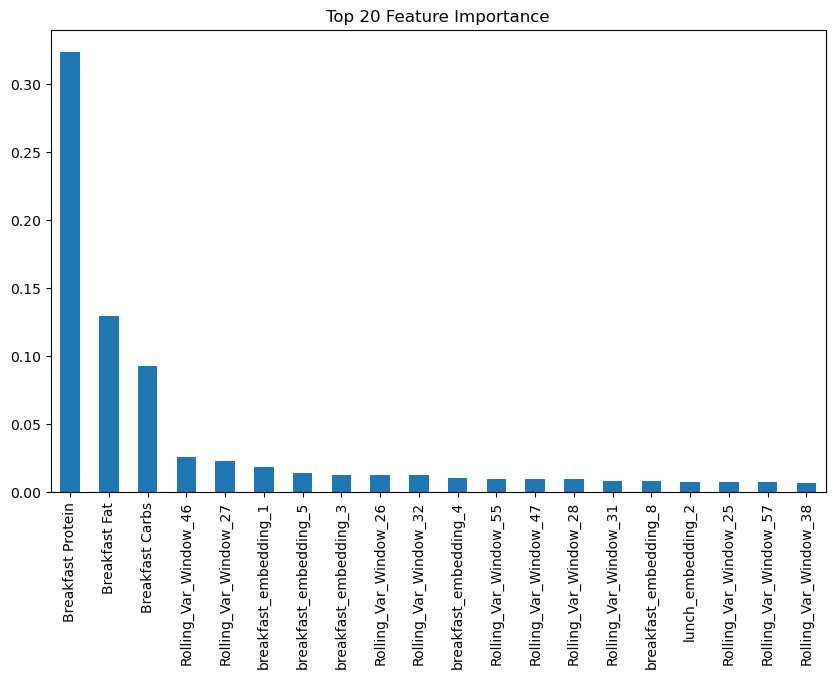

In [ ]:
from sklearn.ensemble import RandomForestRegressor
import pandas as pd

# Fit a RandomForest model to identify feature importance
rf = RandomForestRegressor(random_state=42)
rf.fit(checking_in_rbf, merged_df['Lunch Calories'])

# Feature importance
feature_importance = pd.Series(rf.feature_importances_, index=checking_in_rbf.columns)
feature_importance = feature_importance.sort_values(ascending=False)

# Plot feature importance
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
feature_importance.head(20).plot(kind='bar')
plt.title("Top 20 Feature Importance")
plt.show()

In [ ]:
# X_scaled = pd.DataFrame(X_train_scaled, columns=checking_in_rbf.columns)

In [ ]:
feature_importance[:20]

Breakfast Protein        0.323825
Breakfast Fat            0.129578
Breakfast Carbs          0.092953
Rolling_Var_Window_46    0.025429
Rolling_Var_Window_27    0.022820
breakfast_embedding_1    0.018144
breakfast_embedding_5    0.014155
breakfast_embedding_3    0.012732
Rolling_Var_Window_26    0.012590
Rolling_Var_Window_32    0.012589
breakfast_embedding_4    0.010544
Rolling_Var_Window_55    0.009804
Rolling_Var_Window_47    0.009763
Rolling_Var_Window_28    0.009193
Rolling_Var_Window_31    0.008376
breakfast_embedding_8    0.008068
lunch_embedding_2        0.007603
Rolling_Var_Window_25    0.007600
Rolling_Var_Window_57    0.007447
Rolling_Var_Window_38    0.006894
dtype: float64

In [ ]:
# Extract the names of the top 20 features
top_20_features = feature_importance.index[:20].tolist()
print(top_20_features)


['Breakfast Protein', 'Breakfast Fat', 'Breakfast Carbs', 'Rolling_Var_Window_46', 'Rolling_Var_Window_27', 'breakfast_embedding_1', 'breakfast_embedding_5', 'breakfast_embedding_3', 'Rolling_Var_Window_26', 'Rolling_Var_Window_32', 'breakfast_embedding_4', 'Rolling_Var_Window_55', 'Rolling_Var_Window_47', 'Rolling_Var_Window_28', 'Rolling_Var_Window_31', 'breakfast_embedding_8', 'lunch_embedding_2', 'Rolling_Var_Window_25', 'Rolling_Var_Window_57', 'Rolling_Var_Window_38']


In [ ]:
from sklearn.preprocessing import StandardScaler

# Features and target
X = merged_df[top_20_features]
target_column = merged_df['Lunch Calories']


In [ ]:
type(feature_importance)

pandas.core.series.Series

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, target_column, test_size=0.2, random_state=42)

In [ ]:
X_train

,Breakfast Protein,Breakfast Fat,Breakfast Carbs,Rolling_Var_Window_46,Rolling_Var_Window_27,breakfast_embedding_1,breakfast_embedding_5,breakfast_embedding_3,Rolling_Var_Window_26,Rolling_Var_Window_32,breakfast_embedding_4,Rolling_Var_Window_55,Rolling_Var_Window_47,Rolling_Var_Window_28,Rolling_Var_Window_31,breakfast_embedding_8,lunch_embedding_2,Rolling_Var_Window_25,Rolling_Var_Window_57,Rolling_Var_Window_38
33,22.0,10.5,66.0,1.375959,15.748350,-41.449986,23.394979,4.872314,9.478354,1.554862,10.389110,95.465381,1.138799,21.411986,4.235426,2.544124,6.842144,4.682941,14.289636,0.039474
184,66.0,10.5,66.0,9.682905,12.044190,-16.217503,48.650684,1.430388,11.786560,3.680879,-1.532006,11.677084,19.298661,9.212156,3.966999,29.039370,-65.553978,11.489767,46.216225,16.815764
142,66.0,42.0,73.0,15.234716,174.987007,-10.279957,-16.707693,29.382463,164.943742,9.654785,-36.926842,0.687310,7.713562,104.228333,10.324282,3.771981,-23.605789,90.676376,6.861633,11.557416
197,22.0,42.0,66.0,241.715732,1074.289020,-40.256016,6.857372,-37.428871,458.569052,239.483793,18.232086,49.079371,116.206873,1751.634701,698.882797,-6.318756,-5.243234,311.819813,335.398020,186.649084
37,22.0,10.5,24.0,1.505547,3.809618,-17.526571,-1.991243,-24.875532,7.009618,1.844061,-11.456956,95.515569,0.605547,1.777618,1.432600,21.291435,-5.299062,9.073896,38.571372,1.473896
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20,22.0,10.5,66.0,7.376447,93.319754,-28.059725,-6.847359,-31.048746,48.819310,37.009879,12.890747,151.636460,8.921340,125.730911,30.439460,-12.445939,4.077411,21.578849,152.060679,3.131354
188,22.0,10.5,66.0,3.757003,42.367516,-12.301599,19.431643,-15.677459,21.242412,5.600807,-33.008255,55.493150,3.008136,42.183319,3.652640,35.734642,-49.648315,16.269767,81.497519,2.750880
71,66.0,10.5,66.0,21.249760,11.189547,-21.543400,-76.350891,-42.055202,32.509227,1.719467,-23.203833,28.230667,12.035627,2.542080,2.351200,7.831190,31.679234,44.343947,0.909067,42.088320
106,22.0,10.5,66.0,8.671412,21.646877,-62.019039,25.443005,16.479492,45.118131,0.395357,-6.554017,17.602975,18.341896,9.030616,0.338689,-0.739209,32.906067,99.366806,4.139949,42.942324


In [ ]:
from sklearn.preprocessing import StandardScaler

# Use StandardScaler for features
scaler_X = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train)
X_test_scaled = scaler_X.transform(X_test)

# Retain y_train and y_test in their original scale
y_train_scaled = y_train  # Keep original target values
y_test_scaled = y_test

In [ ]:
pca_on_final = PCA(n_components=2)  # You can change this to any number of components you prefer
X_train_pca = pca_on_final.fit_transform(X_train_scaled)
X_test_pca = pca_on_final.transform(X_test_scaled)

In [ ]:
X_train_pca

array([[-1.18473685e+00, -5.77202315e-01],
       [-1.15349663e+00, -1.07783557e+00],
       [-4.13499410e-01, -4.33923479e-01],
       [ 8.59929164e+00, -6.73231337e-01],
       [-1.39859729e+00, -4.96938854e-01],
       [-1.64588647e-01, -4.57663083e-01],
       [-6.45909661e-01, -2.27160645e-01],
       [ 1.83241779e-01, -3.87464881e-01],
       [ 2.31948215e+00,  4.87319628e+00],
       [ 4.88810637e+00, -1.68775994e+00],
       [-1.39024574e+00, -2.72445717e-01],
       [-2.79067134e-01, -1.88548105e-01],
       [ 9.28747404e+00, -3.55945836e+00],
       [ 1.71714650e+00, -4.67437232e-01],
       [-7.90119787e-01,  5.11444059e+00],
       [-1.87275704e-01, -2.47630217e-01],
       [-1.53066868e+00, -7.26359403e-01],
       [-7.85659892e-01, -2.90149584e-01],
       [-2.47760276e-01,  2.04203428e+00],
       [-1.86917893e-01,  1.18855589e+00],
       [ 1.27212129e+00, -6.13480849e-01],
       [ 7.94336788e-02, -2.51264695e-01],
       [-6.04561488e-01,  1.61786341e-01],
       [ 4.

### MODEL ARCHITECTURE

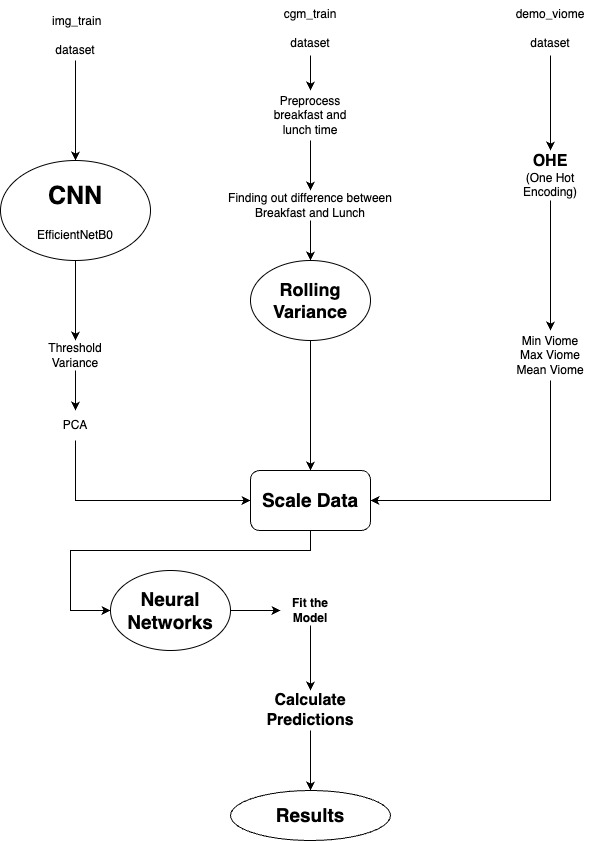

In [ ]:
# Step 1: rmsre value
def modified_mse_for_rmsre(y_true, y_pred):
    epsilon = 1e-8  # Small constant for numerical stability
    y_true = tf.cast(y_true, tf.float32)  # Cast y_true to float32
    relative_error = (y_true - y_pred) / (y_true + epsilon)
    return tf.sqrt(tf.reduce_mean(tf.square(relative_error)))


# Step 2: Build the ANN model
model = keras.Sequential([
    layers.Input(shape=(X_train_pca.shape[1],)),  # Input layer
    layers.Dense(64, activation='relu'),      # Hidden layer with 64 units
    layers.Dense(32, activation='relu'),      # Hidden layer with 32 units
    layers.Dense(16, activation='relu'),      # Hidden layer with 16 units
    layers.Dense(1)                           # Output layer with 1 regression output
])


# Step 3: Compile the model
model.compile(optimizer='adam', loss=modified_mse_for_rmsre)  # Use the custom RMSRE loss function

# Step 4: Train the model
history = model.fit(X_train_pca, y_train_scaled, epochs=100, batch_size=32, validation_split=0.2)

# Step 5: Evaluate the model
test_loss = model.evaluate(X_test_pca, y_test_scaled)
print(f'Test Loss (RMSRE): {test_loss}')

# Step 6: Make predictions
predictions = model.predict(X_test_pca)

Epoch 1/100
6/6 [==============================] - 1s 45ms/step - loss: 0.9997 - val_loss: 0.9996
Epoch 2/100
6/6 [==============================] - 0s 13ms/step - loss: 0.9994 - val_loss: 0.9994
Epoch 3/100
6/6 [==============================] - 0s 11ms/step - loss: 0.9990 - val_loss: 0.9991
Epoch 4/100
6/6 [==============================] - 0s 11ms/step - loss: 0.9986 - val_loss: 0.9987
Epoch 5/100
6/6 [==============================] - 0s 10ms/step - loss: 0.9980 - val_loss: 0.9981
Epoch 6/100
6/6 [==============================] - 0s 9ms/step - loss: 0.9974 - val_loss: 0.9974
Epoch 7/100
6/6 [==============================] - 0s 8ms/step - loss: 0.9964 - val_loss: 0.9965
Epoch 8/100
6/6 [==============================] - 0s 11ms/step - loss: 0.9952 - val_loss: 0.9953
Epoch 9/100
6/6 [==============================] - 0s 10ms/step - loss: 0.9936 - val_loss: 0.9938
Epoch 10/100
6/6 [==============================] - 0s 10ms/step - loss: 0.9914 - val_loss: 0.9917
Epoch 11/100
6/6 [===

Epoch 84/100
6/6 [==============================] - 0s 13ms/step - loss: 0.3481 - val_loss: 0.3521
Epoch 85/100
6/6 [==============================] - 0s 11ms/step - loss: 0.3478 - val_loss: 0.3519
Epoch 86/100
6/6 [==============================] - 0s 12ms/step - loss: 0.3468 - val_loss: 0.3519
Epoch 87/100
6/6 [==============================] - 0s 14ms/step - loss: 0.3472 - val_loss: 0.3516
Epoch 88/100
6/6 [==============================] - 0s 13ms/step - loss: 0.3449 - val_loss: 0.3508
Epoch 89/100
6/6 [==============================] - 0s 11ms/step - loss: 0.3454 - val_loss: 0.3498
Epoch 90/100
6/6 [==============================] - 0s 10ms/step - loss: 0.3449 - val_loss: 0.3488
Epoch 91/100
6/6 [==============================] - 0s 10ms/step - loss: 0.3438 - val_loss: 0.3482
Epoch 92/100
6/6 [==============================] - 0s 11ms/step - loss: 0.3437 - val_loss: 0.3477
Epoch 93/100
6/6 [==============================] - 0s 11ms/step - loss: 0.3429 - val_loss: 0.3471
Epoch 94/1

In [ ]:
predictions

array([[465.8467 ],
       [434.0123 ],
       [436.34723],
       [462.9681 ],
       [437.03873],
       [465.5216 ],
       [603.0247 ],
       [426.00955],
       [455.7236 ],
       [442.25998],
       [503.32733],
       [444.20825],
       [404.0057 ],
       [477.3102 ],
       [467.1636 ],
       [413.57614],
       [379.3962 ],
       [440.55988],
       [456.5129 ],
       [465.00262],
       [507.74463],
       [487.43814],
       [493.89542],
       [514.20465],
       [437.40457],
       [468.16428],
       [430.91943],
       [461.2642 ],
       [447.75107],
       [409.99283],
       [471.51743],
       [439.0635 ],
       [499.62952],
       [495.85745],
       [428.97968],
       [492.87753],
       [470.53964],
       [430.72018],
       [439.03897],
       [457.61176],
       [420.44907],
       [443.5454 ],
       [362.1561 ],
       [429.56796],
       [419.77307],
       [487.79688],
       [552.1038 ],
       [470.80994],
       [454.31766],
       [393.38083],


In [ ]:
y_test

30      435
116     555
79      830
127     435
196     435
137     555
209     355
45      830
158     435
247     830
183     830
269     555
227     555
82      830
165    1180
194     355
226     435
146     355
104     555
60     1180
221     830
267     830
46      435
42      555
185     555
9       435
22      555
199    1180
109     355
24      830
113     355
68      355
144     435
224     355
252     435
6       435
120     435
67      555
119     830
118    1180
25      435
125     355
244     555
19      355
77      355
216     355
90      830
208     435
93      355
180     435
15      555
152     435
232     355
250     355
115     435
Name: Lunch Calories, dtype: int64

In [ ]:
import keras_tuner as kt
from tensorflow.keras.optimizers import Adam

# Define the model as a hypermodel
def build_model(hp):
    model = keras.Sequential()
    model.add(layers.Input(shape=(X_train_pca.shape[1],)))

    # Increase the number of layers and units
    for i in range(hp.Int("num_layers", 3, 6)):
        model.add(
            layers.Dense(
                units=hp.Int(f"units_{i}", min_value=64, max_value=512, step=64),
                activation="relu",
            )
        )
    model.add(layers.Dense(1))  # Single output for regression

    model.compile(
        optimizer=Adam(learning_rate=hp.Float("learning_rate", 1e-5, 1e-2, sampling="log")),
        loss= modified_mse_for_rmsre,
    )
    return model


# Initialize the tuner
tuner = kt.Hyperband(
    build_model,
    objective="val_loss",  # Minimize validation loss
    max_epochs=50,
    factor=3,
    directory="hyper_tuning",
    project_name="rmsre_ann_tuning",
)

# Perform the search
tuner.search(X_train_pca, y_train_scaled, validation_split=0.2, epochs=50, batch_size=32)

# Get the best hyperparameters and model
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
print(f"Best hyperparameters: {best_hps.values}")

# Build and train the best model
best_model = tuner.hypermodel.build(best_hps)
history = best_model.fit(X_train_pca, y_train_scaled, validation_split=0.2, epochs=100, batch_size=32)

# Evaluate on the test set
test_loss = best_model.evaluate(X_test_pca, y_test_scaled)
print(f"Test Loss (RMSRE): {test_loss}")

# Predictions
predictions = best_model.predict(X_test_pca)
print(f'Predictions: {predictions[:5]}')


Reloading Tuner from hyper_tuning\rmsre_ann_tuning\tuner0.json
Best hyperparameters: {'num_layers': 5, 'units_0': 48, 'activation': 'tanh', 'units_1': 128, 'learning_rate': 0.0038526189573804743, 'units_2': 112, 'units_3': 32, 'units_4': 112, 'tuner/epochs': 50, 'tuner/initial_epoch': 17, 'tuner/bracket': 3, 'tuner/round': 3, 'tuner/trial_id': '0047'}
Epoch 1/100
6/6 [==============================] - 1s 34ms/step - loss: 0.9996 - val_loss: 0.9980
Epoch 2/100
6/6 [==============================] - 0s 14ms/step - loss: 0.9943 - val_loss: 0.9817
Epoch 3/100
6/6 [==============================] - 0s 16ms/step - loss: 0.9572 - val_loss: 0.8827
Epoch 4/100
6/6 [==============================] - 0s 14ms/step - loss: 0.7730 - val_loss: 0.5237
Epoch 5/100
6/6 [==============================] - 0s 10ms/step - loss: 0.6452 - val_loss: 0.5005
Epoch 6/100
6/6 [==============================] - 0s 9ms/step - loss: 0.5135 - val_loss: 0.4728
Epoch 7/100
6/6 [==============================] - 0s 11ms/

6/6 [==============================] - 0s 11ms/step - loss: 0.3116 - val_loss: 0.3460
Epoch 81/100
6/6 [==============================] - 0s 11ms/step - loss: 0.3186 - val_loss: 0.3436
Epoch 82/100
6/6 [==============================] - 0s 21ms/step - loss: 0.3125 - val_loss: 0.3430
Epoch 83/100
6/6 [==============================] - 0s 14ms/step - loss: 0.3134 - val_loss: 0.3472
Epoch 84/100
6/6 [==============================] - 0s 14ms/step - loss: 0.3111 - val_loss: 0.3409
Epoch 85/100
6/6 [==============================] - 0s 17ms/step - loss: 0.3123 - val_loss: 0.3432
Epoch 86/100
6/6 [==============================] - 0s 13ms/step - loss: 0.3123 - val_loss: 0.3441
Epoch 87/100
6/6 [==============================] - 0s 12ms/step - loss: 0.3125 - val_loss: 0.3426
Epoch 88/100
6/6 [==============================] - 0s 12ms/step - loss: 0.3107 - val_loss: 0.3459
Epoch 89/100
6/6 [==============================] - 0s 11ms/step - loss: 0.3149 - val_loss: 0.3449
Epoch 90/100
6/6 [=====

In [ ]:
predictions

array([[581.93787],
       [450.52853],
       [564.0734 ],
       [413.14075],
       [425.62222],
       [478.94348],
       [576.44293],
       [552.4991 ],
       [413.31213],
       [577.3702 ],
       [645.7756 ],
       [516.6025 ],
       [495.51245],
       [624.31775],
       [431.78833],
       [534.3941 ],
       [461.04245],
       [392.06183],
       [516.7784 ],
       [409.5091 ],
       [523.2851 ],
       [452.14053],
       [634.9273 ],
       [502.97452],
       [548.6917 ],
       [425.25128],
       [423.88007],
       [458.31503],
       [387.6309 ],
       [434.52045],
       [419.11743],
       [408.8329 ],
       [449.2079 ],
       [454.53607],
       [412.77847],
       [440.12292],
       [414.41537],
       [560.46796],
       [456.12152],
       [543.0598 ],
       [387.97754],
       [390.2302 ],
       [464.5306 ],
       [443.83603],
       [375.27356],
       [511.83258],
       [539.3934 ],
       [534.0329 ],
       [460.69046],
       [501.06772],


## testing

In [ ]:
img_test = pd.read_csv('img_test.csv')
demo_viome_test = pd.read_csv('demo_viome_test.csv')
cgm_test = pd.read_csv('cgm_test.csv')

In [ ]:
array_of_means = []
array_of_max = []
array_of_min = []
for i in range(len(demo_viome_test)):
    list1 = demo_viome_test['Viome'][i].split(',')
    random_sum = 0
    random_max = -1000
    random_min = 1000
    for j in list1:
        temp_num = float(j)
        random_sum += temp_num
        if temp_num > random_max:
            random_max = temp_num
        if temp_num < random_min:
            random_min = temp_num
    print('random mean', random_sum/27)
    print('random max',random_max)
    print('random min',random_min)
    array_of_means.append(random_sum/27)
    array_of_max.append(random_max)
    array_of_min.append(random_min)
    print('----------------------')

random mean -0.7717252154341878
random max 4.9980607644247845
random min -8.159737251015637
----------------------
random mean 0.7645598135504881
random max 5.449717964951418
random min -2.940799640959322
----------------------
random mean 1.296304819280579
random max 44.5262736442813
random min -9.295344245726843
----------------------
random mean 0.25850684742421925
random max 9.301906171641043
random min -2.2736856849480764
----------------------
random mean 0.2599591027794322
random max 7.722202301019041
random min -2.3388141183289735
----------------------
random mean 0.16422953054974612
random max 7.734517439022438
random min -1.3715045458893813
----------------------
random mean -0.12513157417617143
random max 7.046517589342004
random min -3.1829735996132125
----------------------
random mean 0.2957185987156572
random max 7.9732673750631555
random min -1.6038292761700494
----------------------
random mean -1.082696876179227
random max 9.246009219761879
random min -10.76529973340

In [ ]:
np_array_of_means = np.array(array_of_means)
np_array_of_max = np.array(array_of_max)
np_array_of_min = np.array(array_of_min)

In [ ]:
# Example: Add aggregate statistics as features
demo_viome_test['Viome_Mean'] = np_array_of_means
demo_viome_test['Viome_Max'] = np_array_of_max
demo_viome_test['Viome_Min'] = np_array_of_min

In [ ]:
demo_viome_test.drop(columns=['Viome'], inplace=True)

In [ ]:
demo_viome_test['Race'].unique()
race_encoded = pd.get_dummies(demo_viome_test['Race'], prefix='Race')
race_encoded.drop(columns=['Race_White'], inplace = True)
demo_viome_test = pd.concat([demo_viome_test, race_encoded], axis=1)
demo_viome_test = demo_viome_test.drop(columns=['Race'])

In [ ]:
Image_Before_Breakfast_matrix = []
null_breakfast = []
for i in range(len(img_test)):
    string_matrix = img_test['Image Before Breakfast'][i]
    parsed_matrix = ast.literal_eval(string_matrix)
    matrix_array = np.array(parsed_matrix)
    print(f"Matrix shape: {matrix_array.shape}, index: {i}")
    print(type(matrix_array))
    if matrix_array.shape == (0,):
        null_breakfast.append(i)
    else:
        Image_Before_Breakfast_matrix.append(matrix_array)

Matrix shape: (64, 64, 3), index: 0
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 1
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 2
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 3
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 4
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 5
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 6
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 7
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 8
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 9
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 10
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 11
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 12
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 13
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 14
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 15
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 

In [ ]:
img_test = img_test.drop(null_breakfast)

In [ ]:
img_test = img_test.reset_index(drop=True)

In [ ]:
Image_Before_Breakfast_matrix

[array([[[ 55,  75,  29],
         [ 55,  77,  27],
         [ 53,  76,  24],
         ...,
         [ 95,  97,  97],
         [ 92,  95,  94],
         [177, 173, 173]],
 
        [[ 61,  82,  41],
         [ 66,  87,  47],
         [ 69,  90,  50],
         ...,
         [173, 169, 170],
         [186, 181, 182],
         [236, 230, 232]],
 
        [[ 67,  87,  51],
         [ 68,  90,  53],
         [ 72,  94,  56],
         ...,
         [254, 244, 246],
         [255, 246, 247],
         [251, 241, 242]],
 
        ...,
 
        [[  8,   8,   6],
         [  7,   8,   6],
         [ 11,  12,   9],
         ...,
         [ 56,  57,  61],
         [ 58,  59,  63],
         [ 56,  57,  61]],
 
        [[ 13,  13,  12],
         [ 11,  11,   8],
         [ 12,  13,  10],
         ...,
         [ 55,  56,  61],
         [ 55,  56,  61],
         [ 57,  58,  63]],
 
        [[ 20,  21,  17],
         [ 14,  16,  11],
         [ 13,  13,  11],
         ...,
         [ 58,  59,  64],
  

In [ ]:
for i in range(len(Image_Before_Breakfast_matrix)):
    print(Image_Before_Breakfast_matrix[1].shape)

(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)


In [ ]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.applications.efficientnet import preprocess_input
import numpy as np
import tensorflow as tf

embeddings = extract_embeddings(model_cnn,Image_Before_Breakfast_matrix )

# Check the shape of embeddings
print("Embeddings shape:", embeddings.shape)

3/3 [==============================] - 7s 2s/step
Embeddings shape: (73, 62720)


In [ ]:
for i in range(embeddings.shape[1]):
    if embeddings[0][i] != 0.0:
        print(embeddings[0][i])
        print(i)

-0.0012586442
0
-0.037120566
1
-0.04740238
2
-0.23983712
3
3.6268075
4
-0.10274772
5
-0.093351446
6
0.0714953
7
-0.15756972
8
2.016271
9
1.1085742
10
-0.25392565
11
-0.04477028
12
-0.07914425
13
0.4527318
14
-0.1288999
15
-0.2669799
16
-0.011590613
17
-0.054426476
18
-0.022052271
19
4.6656933
20
-0.27684072
21
-0.22461045
22
0.3382457
23
-0.23259377
24
0.6480787
25
-0.15190946
26
-0.12271071
27
-0.27742654
28
-0.15646285
29
-0.23665197
30
-0.035712168
31
-0.14289315
32
-0.2688276
33
-0.16972156
34
2.5896628
35
-0.063807994
36
0.19811979
37
-0.068383664
38
-0.21633793
39
-0.016716413
40
0.43152198
41
-0.22845376
42
-0.21056436
43
-0.23693064
44
-0.00094464316
45
-0.10815004
46
-0.2763193
47
-0.116229974
48
-0.23858374
49
-0.26694602
50
-0.2596545
51
-0.047636017
52
-0.2140398
53
-0.03973982
54
-0.04181109
55
-0.23753959
56
-0.05774684
57
-0.20766568
58
2.2527654
59
-0.082404636
60
-0.22844054
61
-0.2619095
62
-0.2076249
63
-0.17545468
64
-0.27621567
65
-0.24721389
66
1.5098685
67
1.1834

-0.27617833
8763
-0.2580204
8764
-0.08839052
8765
-0.27687612
8766
0.018915243
8767
-0.14993772
8768
5.3697057
8769
-0.1486
8770
-0.14788999
8771
-0.118374564
8772
-0.25120017
8773
-0.25636545
8774
-0.030620465
8775
-0.18542677
8776
-0.2477924
8777
-0.1457907
8778
-0.17581855
8779
0.9237874
8780
-0.23365532
8781
-0.23107897
8782
0.64839065
8783
-0.24670433
8784
0.6288863
8785
-0.10142306
8786
-0.049373526
8787
-0.26739988
8788
-0.21781148
8789
-0.07361887
8790
-0.27513206
8791
-0.15110277
8792
-0.04455402
8793
0.9909086
8794
-0.09840806
8795
-0.116374284
8796
-0.14612104
8797
-0.17215186
8798
-0.20033346
8799
0.05527105
8800
-0.21684188
8801
-0.16566627
8802
-0.01730867
8803
0.008036281
8804
-0.03351034
8805
1.5107499
8806
-0.11647263
8807
-0.27694988
8808
-0.052028555
8809
-0.25129905
8810
-0.10674312
8811
-0.11150198
8812
-0.071305275
8813
-0.19164777
8814
-0.090716764
8815
-0.0933969
8816
-0.07228903
8817
-0.059572533
8818
-0.12768526
8819
-0.1423269
8820
0.32738176
8821
0.5441623
8

-0.2537719
13320
0.38489854
13321
-0.115669325
13322
2.0263
13323
-0.24497823
13324
-0.206566
13325
1.6071968
13326
-0.17945696
13327
-0.14763899
13328
-0.19396907
13329
-0.101810284
13330
-0.10773159
13331
-0.09183473
13332
-0.25098303
13333
0.8385773
13334
0.22178584
13335
0.43236053
13336
-0.054943606
13337
-0.10023833
13338
-0.25142133
13339
-0.112427294
13340
-0.24760269
13341
-0.030548958
13342
-0.07305466
13343
-0.10184589
13344
-0.017310888
13345
-0.13981669
13346
-0.15305188
13347
-0.2530008
13348
-0.0359484
13349
-0.2550389
13350
-0.18028276
13351
-0.097469375
13352
-0.049692057
13353
-0.18046448
13354
-0.0052364003
13355
-0.0038267311
13356
-0.27805153
13357
-0.13168707
13358
2.6559403
13359
-0.114690766
13360
0.51651406
13361
-0.06765682
13362
-0.27521312
13363
-0.24075286
13364
-0.21985649
13365
-0.27795058
13366
-0.16492276
13367
-0.1885593
13368
-0.271417
13369
-0.1431352
13370
-0.14999385
13371
-0.0460087
13372
-0.08022255
13373
-0.21324408
13374
-0.14455378
13375
1.400

-0.19491497
23894
-0.09543504
23895
-0.22229347
23896
-0.19310059
23897
-0.17427304
23898
-0.17606792
23899
-0.0042500165
23900
-0.08524803
23901
-0.19506857
23902
-0.021179685
23903
-0.0025110897
23904
-0.051422447
23905
-0.036411785
23906
-0.06865992
23907
-0.2752698
23908
-0.0027114262
23909
3.4725316
23910
0.5094471
23911
-0.18675895
23912
-0.004815251
23913
-0.033548202
23914
-0.0035492193
23915
-0.0053574266
23916
-0.003067422
23917
-0.013412245
23918
-0.031189118
23919
-0.2663582
23920
-0.010261721
23921
-0.1912124
23922
-0.041725613
23923
-0.07106887
23924
0.5767811
23925
-0.06392651
23926
-0.0019743599
23927
0.03739162
23928
0.16493702
23929
-0.12838916
23930
-0.22814314
23931
6.7541666
23932
-0.2658172
23933
-0.02115943
23934
1.1878206
23935
-0.001568806
23936
-0.12825337
23937
-0.009555657
23938
-0.008882055
23939
-0.06291949
23940
-0.2760128
23941
-0.2747208
23942
-0.0008893459
23943
2.7725294
23944
-0.010991525
23945
-0.040195417
23946
-0.006883843
23947
3.5771327
23948
1.

-0.19811474
27295
-0.14184144
27296
-0.023392541
27297
-0.2604153
27298
-0.014598925
27299
-0.07822962
27300
-0.041520678
27301
-0.0760746
27302
-0.21920334
27303
-0.06728758
27304
-0.093911216
27305
-0.1244861
27306
-0.016628467
27307
0.14317678
27308
-0.010659393
27309
-0.016820276
27310
-0.12845555
27311
-0.11624692
27312
-0.06977423
27313
-0.21842733
27314
-0.27811524
27315
-0.010639032
27316
0.8724093
27317
-0.15170777
27318
-0.14251368
27319
-0.2573342
27320
-0.04864511
27321
-0.25835606
27322
-0.18112557
27323
-0.26668295
27324
-0.2744282
27325
-0.014095469
27326
-0.13975069
27327
-0.15813617
27328
-0.024748106
27329
-0.030546991
27330
-0.016521694
27331
-0.037082694
27332
-0.15494616
27333
-0.051045842
27334
-0.2638908
27335
-0.25525063
27336
-0.11232136
27337
-0.2783946
27338
-0.034351192
27339
-0.059134368
27340
-0.12607507
27341
-0.066835634
27342
-0.06458505
27343
-0.050924513
27344
-0.07446147
27345
-0.047725506
27346
0.90545034
27347
-0.24481033
27348
-0.059385303
27349
-

-0.0228338
30887
-0.0036572882
30888
-0.18985957
30889
-0.1962596
30890
-0.20938733
30891
2.9468615
30892
-0.00039088723
30893
-0.21232352
30894
-0.0054530874
30895
-0.015386939
30896
0.5390552
30897
-0.22727498
30898
-0.0005548941
30899
-0.11372733
30900
-0.0053498223
30901
-0.0014293463
30902
-0.17615043
30903
-0.018170899
30904
-0.011156063
30905
-3.0631404e-06
30906
-0.10219956
30907
-0.017816598
30908
-0.26143917
30909
-0.00089868053
30910
0.14498705
30911
-0.16071437
30912
-0.0569204
30913
-0.01009053
30914
-0.004878105
30915
-0.1908287
30916
-0.27312806
30917
4.1429577
30918
-0.021363826
30919
-0.17864509
30920
-0.2667688
30921
-2.9142555e-07
30922
-9.817304e-06
30923
5.557641
30924
-0.06252873
30925
-0.2653687
30926
0.13080956
30927
-0.006928063
30928
-0.00027564968
30929
-0.0011842346
30930
-0.007303829
30931
-0.018882569
30932
-0.00791493
30933
-0.04022132
30934
-0.24985789
30935
-0.0017876603
30936
-0.0015303671
30937
1.401099
30938
-0.037873786
30939
-0.072144315
30940
-0.2

38205
2.5398993
38206
-0.19100633
38207
-0.27734467
38208
-0.20857416
38209
-0.020028045
38210
-0.11335153
38211
0.2703655
38212
-0.15765533
38213
-0.04973702
38214
-0.0590593
38215
-0.005794437
38216
-0.23761284
38217
-0.270017
38218
-0.2448229
38219
-0.2764681
38220
-0.07503291
38221
-0.08939622
38222
-0.26491022
38223
-0.2145797
38224
-0.16113888
38225
-0.039095026
38226
-0.009658054
38227
-0.22627458
38228
-0.089048035
38229
-0.15846299
38230
-0.17016621
38231
-0.034034062
38232
-0.0018003811
38233
-0.22090425
38234
-0.22617206
38235
0.8329621
38236
-0.12909918
38237
-0.12694275
38238
-0.0072312183
38239
-0.23502292
38240
-0.14657341
38241
-0.13209349
38242
-0.11711255
38243
-0.02717736
38244
-0.022865882
38245
-0.26868767
38246
3.9859705
38247
0.523961
38248
2.0110986
38249
-0.01225249
38250
2.000759
38251
-0.2675954
38252
-0.0694857
38253
-0.22086789
38254
-0.16519764
38255
-0.14839815
38256
-0.018582616
38257
-0.14558741
38258
-0.13374299
38259
-0.18996628
38260
-0.03801832
3826

43185
1.331608
43186
-0.25737807
43187
-0.07882993
43188
-0.006939353
43189
-0.01100022
43190
-0.046631176
43191
0.3309271
43192
-0.008851151
43193
-0.20282137
43194
-0.17467897
43195
0.6226296
43196
-0.18292493
43197
-0.039137293
43198
-0.12864107
43199
0.4621711
43200
-0.015429377
43201
3.469188
43202
-0.21586312
43203
-0.14755973
43204
-0.17552142
43205
-0.25927567
43206
-0.027375532
43207
-0.27832657
43208
-0.0985151
43209
-0.20417635
43210
-0.020539466
43211
-0.2784193
43212
-0.2420944
43213
-0.27846408
43214
-0.14927274
43215
-0.18320411
43216
-0.15557596
43217
1.0509818
43218
-0.012608169
43219
-0.07953715
43220
-0.18214366
43221
-0.012762291
43222
-0.21326828
43223
-0.18631878
43224
-0.21222909
43225
1.2978541
43226
-0.1698658
43227
-0.0662896
43228
-0.21609126
43229
-0.12951212
43230
-0.27842468
43231
-0.17528008
43232
-0.08481741
43233
1.5247464
43234
2.6110988
43235
-0.24035382
43236
-0.019107426
43237
-0.08118361
43238
1.3931352
43239
-0.27243003
43240
-0.03800191
43241
-0.

-0.26485008
46974
-0.10205352
46975
-0.23913819
46976
-0.14764598
46977
-0.2571318
46978
-0.042024225
46979
-0.27605128
46980
-0.2729066
46981
-0.042797383
46982
-0.15951718
46983
-0.14700739
46984
-0.03916396
46985
-0.2712361
46986
0.5413902
46987
-0.26416445
46988
-0.26540315
46989
-0.19837108
46990
-0.14961874
46991
-0.119532034
46992
-0.15272638
46993
-0.1998912
46994
0.6407612
46995
-0.27657127
46996
-0.2745477
46997
-0.2647947
46998
-0.25041005
46999
-0.19011226
47000
-0.24701153
47001
-0.20072427
47002
-0.27786428
47003
-0.042576328
47004
-0.21855317
47005
0.2681794
47006
0.2799849
47007
-0.23635899
47008
-0.06898089
47009
-0.2695403
47010
-0.029106217
47011
-0.21454039
47012
-0.22305022
47013
-0.23047043
47014
-0.2767651
47015
-0.14319474
47016
-0.2462016
47017
-0.1299422
47018
-0.277229
47019
-0.27414137
47020
-0.041855216
47021
-0.14745589
47022
-0.1744338
47023
-0.15441114
47024
-0.16262916
47025
-0.048986077
47026
-0.12727034
47027
-0.046264384
47028
-0.06969077
47029
-0.04

-0.27159983
52981
-0.26270366
52982
-0.016199011
52983
-0.05534831
52984
-0.2764874
52985
-0.27845955
52986
0.006591044
52987
-0.1308855
52988
-0.25123027
52989
-0.2760633
52990
-0.053717874
52991
-0.27006853
52992
0.08453154
52993
-0.1736959
52994
-0.15639827
52995
-0.055087537
52996
-0.15382332
52997
2.0378032
52998
-0.19526805
52999
-0.021770688
53000
-0.19859181
53001
-0.058692623
53002
3.3189795
53003
-0.25740093
53004
-0.14395206
53005
0.08685606
53006
-0.23336424
53007
-0.096921
53008
-0.04769108
53009
-0.09004224
53010
1.0970795
53011
3.157018
53012
0.29089972
53013
4.471336
53014
-0.08786778
53015
-0.19670184
53016
-0.25496575
53017
3.5879252
53018
0.3143183
53019
1.1656548
53020
-0.26008028
53021
-0.27702036
53022
-0.26622185
53023
-0.12707584
53024
-0.07082355
53025
-0.0408419
53026
-0.13727254
53027
2.4927104
53028
-0.055662207
53029
1.2686956
53030
-0.25494018
53031
-0.25263384
53032
-0.07873323
53033
0.80795914
53034
-0.21226509
53035
-0.08577936
53036
-0.27817026
53037
-

57618
-0.26601678
57619
-0.21126668
57620
-0.021694986
57621
-0.017112734
57622
-0.25859544
57623
-0.08189385
57624
-0.19947562
57625
-0.27788672
57626
-0.2771999
57627
-0.24638112
57628
-0.13866863
57629
-0.27801165
57630
-0.021927152
57631
-0.11102966
57632
4.260021
57633
-0.20872805
57634
-0.18321458
57635
-0.2518914
57636
-0.010800712
57637
-0.12822346
57638
2.4951127
57639
-0.14398642
57640
-0.27380273
57641
-0.06888425
57642
-0.17751808
57643
0.70290464
57644
-0.27102774
57645
-0.24427359
57646
-0.071823776
57647
-0.124682456
57648
-0.047269627
57649
-0.18708548
57650
-0.14880551
57651
-0.275411
57652
-0.15994766
57653
-0.27835375
57654
2.1718733
57655
-0.2742898
57656
-0.13257061
57657
-0.26643115
57658
-0.26515147
57659
-0.24817783
57660
-0.26636127
57661
-0.2783018
57662
-0.102442466
57663
-0.14525306
57664
-0.098817095
57665
-0.019980557
57666
1.1704749
57667
-0.26202372
57668
-0.1891687
57669
0.3629755
57670
-0.09446737
57671
-0.25244492
57672
-0.10830253
57673
0.009452237
5

In [ ]:
# Step 1: Variance Threshold
reduced_embeddings_variance = reduce_features_with_variance_threshold(embeddings, threshold=0.01)

# Step 2: PCA
reduced_embeddings_pca, _ = reduce_features_with_pca(reduced_embeddings_variance, n_components=10)

print("Final reduced embeddings shape:", reduced_embeddings_pca.shape)


Final reduced embeddings shape: (73, 10)


In [ ]:
embeddings_df = pd.DataFrame(
    reduced_embeddings_pca,
    columns=[f"breakfast_embedding_{i+1}" for i in range(reduced_embeddings_pca.shape[1])]
)

# Step 2: Add embeddings to the original DataFrame
# Ensure the indices match between `img_train` and `embeddings_df`
img_test = img_test.reset_index(drop=True)  # Reset index if needed
img_test = pd.concat([img_test, embeddings_df], axis=1)

# Step 3: Verify the updated DataFrame
print(img_test.head())

   Subject ID  Day                             Image Before Breakfast  \
0           4    2  [[[55, 75, 29], [55, 77, 27], [53, 76, 24], [5...   
1           4    3  [[[56, 170, 210], [100, 189, 216], [140, 217, ...   
2           4    6  [[[227, 153, 39], [219, 145, 33], [211, 136, 3...   
3           4    7  [[[146, 192, 146], [145, 192, 148], [142, 189,...   
4           4    8  [[[201, 239, 155], [208, 242, 156], [211, 242,...   

                                  Image Before Lunch  breakfast_embedding_1  \
0  [[[37, 42, 28], [36, 40, 25], [24, 31, 17], [7...             -42.679127   
1  [[[29, 34, 32], [29, 33, 32], [28, 31, 30], [2...             -37.379665   
2  [[[55, 35, 29], [64, 29, 26], [71, 41, 43], [6...              -3.798647   
3  [[[110, 108, 108], [115, 113, 115], [126, 123,...             -24.559464   
4  [[[88, 87, 100], [95, 95, 107], [89, 90, 100],...             -20.621943   

   breakfast_embedding_2  breakfast_embedding_3  breakfast_embedding_4  \
0           

In [ ]:
img_test.drop(columns=['Image Before Breakfast'], inplace = True)

In [ ]:
Image_Before_Lunch_matrix = []
null_lunch = []
for i in range(len(img_test)):
    string_matrix = img_test['Image Before Lunch'][i]
    parsed_matrix = ast.literal_eval(string_matrix)
    matrix_array = np.array(parsed_matrix)
    print(f"Matrix shape: {matrix_array.shape}, index: {i}")
    print(type(matrix_array))
    if matrix_array.shape == (0,):
        null_lunch.append(i)
    else:
        Image_Before_Lunch_matrix.append(matrix_array)
img_test = img_test.drop(null_lunch)
img_test = img_test.reset_index(drop=True)
embeddings = extract_embeddings(model_cnn,Image_Before_Lunch_matrix )

# Check the shape of embeddings
print("Embeddings shape:", embeddings.shape)

Matrix shape: (64, 64, 3), index: 0
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 1
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 2
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 3
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 4
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 5
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 6
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 7
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 8
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 9
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 10
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 11
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 12
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 13
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 14
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 15
<class 'numpy.ndarray'>
Matrix shape: (64, 64, 3), index: 

In [ ]:
# Step 1: Variance Threshold
reduced_embeddings_variance = reduce_features_with_variance_threshold(embeddings, threshold=0.01)

# Step 2: PCA
reduced_embeddings_pca, _ = reduce_features_with_pca(reduced_embeddings_variance, n_components=10)

print("Final reduced embeddings shape:", reduced_embeddings_pca.shape)

Final reduced embeddings shape: (73, 10)


In [ ]:
import pandas as pd

print(reduced_embeddings_pca.shape)  # Output: (310, 10)

# Step 1: Convert embeddings to a DataFrame
embeddings_df = pd.DataFrame(
    reduced_embeddings_pca,
    columns=[f"lunch_embedding_{i+1}" for i in range(reduced_embeddings_pca.shape[1])]
)

# Step 2: Add embeddings to the original DataFrame
# Ensure the indices match between `img_train` and `embeddings_df`
img_test = img_test.reset_index(drop=True)  # Reset index if needed
img_test = pd.concat([img_test, embeddings_df], axis=1)

# Step 3: Verify the updated DataFrame
print(img_test.head())


(73, 10)
   Subject ID  Day                                 Image Before Lunch  \
0           4    2  [[[37, 42, 28], [36, 40, 25], [24, 31, 17], [7...   
1           4    3  [[[29, 34, 32], [29, 33, 32], [28, 31, 30], [2...   
2           4    6  [[[55, 35, 29], [64, 29, 26], [71, 41, 43], [6...   
3           4    7  [[[110, 108, 108], [115, 113, 115], [126, 123,...   
4           4    8  [[[88, 87, 100], [95, 95, 107], [89, 90, 100],...   

   breakfast_embedding_1  breakfast_embedding_2  breakfast_embedding_3  \
0             -42.679127              12.500648             -10.645627   
1             -37.379665              14.577910             -30.101559   
2              -3.798647              12.506368              12.783736   
3             -24.559464              11.362429              17.879045   
4             -20.621943              -3.772322              19.169588   

   breakfast_embedding_4  breakfast_embedding_5  breakfast_embedding_6  \
0             -35.310940         

In [ ]:
img_test.drop(columns=['Image Before Lunch'], inplace = True)

In [ ]:
cgm_test

,Subject ID,Day,Breakfast Time,Lunch Time,CGM Data
0,4,2,2021-10-02 09:55:00,2021-10-02 13:46:00,"[('2021-10-02 09:55:00', 114.68333333333334), ..."
1,4,3,2021-10-03 09:53:00,2021-10-03 13:46:00,"[('2021-10-03 09:50:00', 103.0), ('2021-10-03 ..."
2,4,6,2021-10-06 09:04:00,2021-10-06 12:36:00,"[('2021-10-06 09:00:00', 96.41), ('2021-10-06 ..."
3,4,7,2021-10-07 08:56:00,2021-10-07 12:32:00,"[('2021-10-07 08:50:00', 95.0), ('2021-10-07 0..."
4,4,8,2021-10-08 09:09:00,2021-10-08 12:36:00,"[('2021-10-08 09:00:00', 94.13666666666667), (..."
...,...,...,...,...,...
68,18,5,2022-04-26 08:30:23,2022-04-26 13:39:53,"[('2022-04-26 08:25:00', 142.94), ('2022-04-26..."
69,18,6,2022-04-27 09:17:34,2022-04-27 13:42:28,"[('2022-04-27 09:15:00', 138.28333333333333), ..."
70,18,7,2022-04-28 08:21:45,2022-04-28 14:57:13,"[('2022-04-28 08:20:00', 138.65666666666667), ..."
71,18,8,2022-04-29 08:52:06,2022-04-29 13:21:09,"[('2022-04-29 08:50:00', 143.71666666666667), ..."


In [ ]:
import pandas as pd
import numpy as np

# Example DataFrame
# Initialize a list to store indices of invalid entries
breakfast_time_null = []

# Check for rows with missing or invalid datetime entries
for i in range(len(cgm_test)):
    value = cgm_test['Breakfast Time'][i]

    if isinstance(value, str):  # Check if it's a string
        try:
            # Validate the datetime format
            pd.to_datetime(value, errors='raise')  # Will throw an error if invalid
        except (ValueError, pd.errors.ParserError):
            breakfast_time_null.append(i)  # Log the index
    else:
        breakfast_time_null.append(i)  # Log NaN or non-string values

# Handle invalid values
if breakfast_time_null:
    print(f"Invalid Breakfast Time indices: {breakfast_time_null}")

    # Strategy: Replace with mean time of valid entries
    valid_times = cgm_test.loc[~cgm_test.index.isin(breakfast_time_null), 'Breakfast Time']
    valid_times = pd.to_datetime(valid_times)  # Convert valid entries to datetime

    # Calculate mean time
    mean_time = valid_times.mean()  # Mean of datetime
    mean_time_str = mean_time.strftime('%Y-%m-%d %H:%M:%S')  # Convert back to string

    # Replace invalid entries with mean time
    cgm_test.loc[breakfast_time_null, 'Breakfast Time'] = mean_time_str



Invalid Breakfast Time indices: [52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]


In [ ]:
cgm_test

,Subject ID,Day,Breakfast Time,Lunch Time,CGM Data
0,4,2,2021-10-02 09:55:00,2021-10-02 13:46:00,"[('2021-10-02 09:55:00', 114.68333333333334), ..."
1,4,3,2021-10-03 09:53:00,2021-10-03 13:46:00,"[('2021-10-03 09:50:00', 103.0), ('2021-10-03 ..."
2,4,6,2021-10-06 09:04:00,2021-10-06 12:36:00,"[('2021-10-06 09:00:00', 96.41), ('2021-10-06 ..."
3,4,7,2021-10-07 08:56:00,2021-10-07 12:32:00,"[('2021-10-07 08:50:00', 95.0), ('2021-10-07 0..."
4,4,8,2021-10-08 09:09:00,2021-10-08 12:36:00,"[('2021-10-08 09:00:00', 94.13666666666667), (..."
...,...,...,...,...,...
68,18,5,2022-04-26 08:30:23,2022-04-26 13:39:53,"[('2022-04-26 08:25:00', 142.94), ('2022-04-26..."
69,18,6,2022-04-27 09:17:34,2022-04-27 13:42:28,"[('2022-04-27 09:15:00', 138.28333333333333), ..."
70,18,7,2022-04-28 08:21:45,2022-04-28 14:57:13,"[('2022-04-28 08:20:00', 138.65666666666667), ..."
71,18,8,2022-04-29 08:52:06,2022-04-29 13:21:09,"[('2022-04-29 08:50:00', 143.71666666666667), ..."


In [ ]:
breakfast_time_null

[52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]

In [ ]:
cgm_test['Breakfast Time'][52]

'2022-12-25 05:38:52'

In [ ]:
import pandas as pd
import numpy as np


# Initialize a list to store indices of invalid entries
lunch_time_null = []

# Check for rows with missing or invalid datetime entries
for i in range(len(cgm_test)):
    value = cgm_test['Lunch Time'][i]

    if isinstance(value, str):  # Check if it's a string
        try:
            # Validate the datetime format
            pd.to_datetime(value, errors='raise')  # Will throw an error if invalid
        except (ValueError, pd.errors.ParserError):
            lunch_time_null.append(i)  # Log the index
    else:
        lunch_time_null.append(i)  # Log NaN or non-string values

# Handle invalid values
if lunch_time_null:
    print(f"Invalid Lunch Time indices: {lunch_time_null}")

    # Strategy: Replace with mean time of valid entries
    valid_times = cgm_test.loc[~cgm_test.index.isin(lunch_time_null), 'Lunch Time']
    valid_times = pd.to_datetime(valid_times)  # Convert valid entries to datetime

    # Calculate mean time
    mean_time = valid_times.mean()  # Mean of datetime
    mean_time_str = mean_time.strftime('%Y-%m-%d %H:%M:%S')  # Convert back to string

    # Replace invalid entries with mean time
    cgm_test.loc[lunch_time_null, 'Lunch Time'] = mean_time_str


Invalid Lunch Time indices: [45, 51, 59, 61, 62]


In [ ]:
cgm_test

,Subject ID,Day,Breakfast Time,Lunch Time,CGM Data
0,4,2,2021-10-02 09:55:00,2021-10-02 13:46:00,"[('2021-10-02 09:55:00', 114.68333333333334), ..."
1,4,3,2021-10-03 09:53:00,2021-10-03 13:46:00,"[('2021-10-03 09:50:00', 103.0), ('2021-10-03 ..."
2,4,6,2021-10-06 09:04:00,2021-10-06 12:36:00,"[('2021-10-06 09:00:00', 96.41), ('2021-10-06 ..."
3,4,7,2021-10-07 08:56:00,2021-10-07 12:32:00,"[('2021-10-07 08:50:00', 95.0), ('2021-10-07 0..."
4,4,8,2021-10-08 09:09:00,2021-10-08 12:36:00,"[('2021-10-08 09:00:00', 94.13666666666667), (..."
...,...,...,...,...,...
68,18,5,2022-04-26 08:30:23,2022-04-26 13:39:53,"[('2022-04-26 08:25:00', 142.94), ('2022-04-26..."
69,18,6,2022-04-27 09:17:34,2022-04-27 13:42:28,"[('2022-04-27 09:15:00', 138.28333333333333), ..."
70,18,7,2022-04-28 08:21:45,2022-04-28 14:57:13,"[('2022-04-28 08:20:00', 138.65666666666667), ..."
71,18,8,2022-04-29 08:52:06,2022-04-29 13:21:09,"[('2022-04-29 08:50:00', 143.71666666666667), ..."


In [ ]:
lunch_time_null

[45, 51, 59, 61, 62]

In [ ]:
cgm_test['Lunch Time'][59]

'2023-02-12 22:16:49'

In [ ]:
cgm_test['Breakfast_Time'] = pd.to_datetime(cgm_test['Breakfast Time'])
cgm_test['Lunch_Time'] = pd.to_datetime(cgm_test['Lunch Time'])
cgm_test['Hour_Breakfast'] = cgm_test['Breakfast_Time'].dt.hour
cgm_test['Day_Of_Week_Breakfast'] = cgm_test['Breakfast_Time'].dt.dayofweek
cgm_test['Time_Between_Breakfast_Lunch'] = (cgm_test['Lunch_Time'] - cgm_test['Breakfast_Time']).dt.total_seconds()

In [ ]:
cgm_test.drop(columns=['Breakfast Time','Lunch Time','Breakfast_Time','Lunch_Time'],inplace = True)

In [ ]:
null_value_in_cgm = 0
for i in range(len(cgm_test)):
    if len(cgm_test['CGM Data'][i]) <= 2:
        null_value_in_cgm = i

In [ ]:
null_value_in_cgm

0

In [ ]:
import ast

def safe_get_glucose_data(cgm_data):
    try:
        # Convert the string to an actual list of tuples
        if isinstance(cgm_data, str):
            cgm_data = ast.literal_eval(cgm_data)  # Convert string to list of tuples

        # Ensure each entry is a tuple and has at least two elements
        if cgm_data and isinstance(cgm_data, list) and all(isinstance(entry, tuple) and len(entry) >= 2 for entry in cgm_data):
            return sum([entry[1] for entry in cgm_data]) / len(cgm_data)
        else:
            return None
    except Exception as e:
        print(f"Error processing data: {e}")
        return None

# Apply the function to the 'CGM Data' column
Mean_Glucose = cgm_test['CGM Data'].apply(safe_get_glucose_data)
print(Mean_Glucose.head())

0    126.723732
1    112.328351
2    109.505667
3    120.224946
4    105.028370
Name: CGM Data, dtype: float64


In [ ]:
cgm_test['CGM Data'] = cgm_test['CGM Data'].apply(ast.literal_eval)

In [ ]:
cgm_test

,Subject ID,Day,CGM Data,Hour_Breakfast,Day_Of_Week_Breakfast,Time_Between_Breakfast_Lunch
0,4,2,"[(2021-10-02 09:55:00, 114.68333333333334), (2...",9,5,13860.0
1,4,3,"[(2021-10-03 09:50:00, 103.0), (2021-10-03 09:...",9,6,13980.0
2,4,6,"[(2021-10-06 09:00:00, 96.41), (2021-10-06 09:...",9,2,12720.0
3,4,7,"[(2021-10-07 08:50:00, 95.0), (2021-10-07 08:5...",8,3,12960.0
4,4,8,"[(2021-10-08 09:00:00, 94.13666666666667), (20...",9,4,12420.0
...,...,...,...,...,...,...
68,18,5,"[(2022-04-26 08:25:00, 142.94), (2022-04-26 08...",8,1,18570.0
69,18,6,"[(2022-04-27 09:15:00, 138.28333333333333), (2...",9,2,15894.0
70,18,7,"[(2022-04-28 08:20:00, 138.65666666666667), (2...",8,3,23728.0
71,18,8,"[(2022-04-29 08:50:00, 143.71666666666667), (2...",8,4,16143.0


In [ ]:
def calculate_rolling_variance(cgm_data, window_size=6):
    # Extract glucose values
    glucose_values = [x[1] for x in cgm_data]

    # Calculate rolling variance
    rolling_var = pd.Series(glucose_values).rolling(window=window_size).var().dropna()

    return rolling_var.tolist()

# Apply rolling variance calculation
window_size = 6  # Half an hour (6 readings for 5-minute intervals)
cgm_test['Rolling_Variances'] = cgm_test['CGM Data'].apply(lambda x: calculate_rolling_variance(x, window_size=window_size))

# Expand rolling variances into separate columns
max_columns = cgm_test['Rolling_Variances'].apply(len).max()  # Find the maximum number of rolling variances
rolling_var_cols = pd.DataFrame(cgm_test['Rolling_Variances'].tolist(),
                                columns=[f'Rolling_Var_Window_{i+1}' for i in range(max_columns)])

# Fill NaN values with 0 in the rolling variance columns
rolling_var_cols = rolling_var_cols.fillna(0)

# Add the new columns to the original DataFrame
cgm_test = pd.concat([cgm_test, rolling_var_cols], axis=1)

# Drop the intermediate Rolling_Variances column for clarity
cgm_test = cgm_test.drop(columns=['Rolling_Variances'])

# Display the updated DataFrame
cgm_test

,Subject ID,Day,CGM Data,Hour_Breakfast,Day_Of_Week_Breakfast,Time_Between_Breakfast_Lunch,Rolling_Var_Window_1,Rolling_Var_Window_2,Rolling_Var_Window_3,Rolling_Var_Window_4,...,Rolling_Var_Window_84,Rolling_Var_Window_85,Rolling_Var_Window_86,Rolling_Var_Window_87,Rolling_Var_Window_88,Rolling_Var_Window_89,Rolling_Var_Window_90,Rolling_Var_Window_91,Rolling_Var_Window_92,Rolling_Var_Window_93
0,4,2,"[(2021-10-02 09:55:00, 114.68333333333334), (2...",9,5,13860.0,906.792425,817.636150,513.711101,205.882546,...,148.538971,97.411208,47.023145,14.466957,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,4,3,"[(2021-10-03 09:50:00, 103.0), (2021-10-03 09:...",9,6,13980.0,68.047477,173.286091,306.504402,398.141852,...,104.978113,251.204439,377.130812,380.061990,247.552367,98.932901,23.160709,0.000000,0.000000,0.000000
2,4,6,"[(2021-10-06 09:00:00, 96.41), (2021-10-06 09:...",9,2,12720.0,120.870711,158.652154,169.573124,141.468888,...,91.974781,96.566039,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,4,7,"[(2021-10-07 08:50:00, 95.0), (2021-10-07 08:5...",8,3,12960.0,101.218870,162.384789,224.656522,246.579411,...,95.919646,130.352221,121.377536,73.224255,29.778154,0.000000,0.000000,0.000000,0.000000,0.000000
4,4,8,"[(2021-10-08 09:00:00, 94.13666666666667), (20...",9,4,12420.0,76.813648,100.330821,116.579218,130.107664,...,46.188849,39.293745,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68,18,5,"[(2022-04-26 08:25:00, 142.94), (2022-04-26 08...",8,1,18570.0,246.798015,118.803213,37.945775,19.026057,...,1.313736,1.271959,0.920393,4.647794,26.577643,36.992593,31.822066,20.112661,8.180216,3.753037
69,18,6,"[(2022-04-27 09:15:00, 138.28333333333333), (2...",9,2,15894.0,285.806550,132.000381,56.095603,54.355123,...,41.278146,27.980789,9.493283,1.877449,0.774662,0.808006,0.205532,0.202695,1.780479,2.616104
70,18,7,"[(2022-04-28 08:20:00, 138.65666666666667), (2...",8,3,23728.0,168.045204,173.677421,133.194808,66.324349,...,1.094371,0.868724,0.868724,1.071926,4.798902,14.688154,19.785652,16.074541,10.950096,3.456309
71,18,8,"[(2022-04-29 08:50:00, 143.71666666666667), (2...",8,4,16143.0,112.498880,155.375455,147.016927,115.629906,...,34.186229,39.408146,29.561809,14.835261,5.163261,5.099914,4.531322,1.796634,1.005938,1.364514


In [ ]:
temp_merge_test = pd.merge(img_test, cgm_test,on=['Subject ID','Day'], how='inner')

In [ ]:
temp_merge1_test = pd.merge(temp_merge_test, label_test,on=['Subject ID','Day'], how = 'inner')

In [ ]:
merged_df_test = pd.merge(temp_merge1_test, demo_viome_test ,on= 'Subject ID')

In [ ]:
merged_df_test.isnull().sum()

Subject ID               0
Day                      0
breakfast_embedding_1    0
breakfast_embedding_2    0
breakfast_embedding_3    0
                        ..
Viome_Mean               0
Viome_Max                0
Viome_Min                0
Race_African American    0
Race_Hispanic/Latino     0
Length: 145, dtype: int64

In [ ]:
merged_df_test

,Subject ID,Day,breakfast_embedding_1,breakfast_embedding_2,breakfast_embedding_3,breakfast_embedding_4,breakfast_embedding_5,breakfast_embedding_6,breakfast_embedding_7,breakfast_embedding_8,...,LDL,VLDL,CHO/HDL Ratio,HOMA-IR,BMI,Viome_Mean,Viome_Max,Viome_Min,Race_African American,Race_Hispanic/Latino
0,4,2,-42.679127,12.500648,-10.645627,-35.310940,-2.498773,-22.427614,-4.572332,8.286851,...,164.0,60.0,5.8,5.029630,42.380119,-0.771725,4.998061,-8.159737,0,1
1,4,3,-37.379665,14.577910,-30.101559,6.205288,-12.417612,30.224619,-42.561359,-25.917810,...,164.0,60.0,5.8,5.029630,42.380119,-0.771725,4.998061,-8.159737,0,1
2,4,6,-3.798647,12.506368,12.783736,-5.881654,-27.920338,14.567465,-34.413761,-36.254631,...,164.0,60.0,5.8,5.029630,42.380119,-0.771725,4.998061,-8.159737,0,1
3,4,7,-24.559464,11.362429,17.879045,-5.466654,21.370888,-47.418358,-37.236107,-66.713814,...,164.0,60.0,5.8,5.029630,42.380119,-0.771725,4.998061,-8.159737,0,1
4,4,8,-20.621943,-3.772322,19.169588,-14.356202,10.015412,-43.549206,0.052588,-31.795044,...,164.0,60.0,5.8,5.029630,42.380119,-0.771725,4.998061,-8.159737,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68,18,5,-37.346615,67.409355,88.436874,5.856069,0.471553,-1.731374,10.274880,18.410875,...,115.0,20.0,4.2,4.425185,38.055023,-1.082697,9.246009,-10.765300,0,1
69,18,6,-36.172424,114.707603,66.000618,43.951260,-20.627029,29.734505,24.593828,10.508165,...,115.0,20.0,4.2,4.425185,38.055023,-1.082697,9.246009,-10.765300,0,1
70,18,7,-16.124144,46.206982,28.864199,9.871563,0.554036,-6.073704,10.199331,-25.220402,...,115.0,20.0,4.2,4.425185,38.055023,-1.082697,9.246009,-10.765300,0,1
71,18,8,-34.628002,76.073685,23.340017,10.628490,6.942287,1.956757,17.688017,2.250767,...,115.0,20.0,4.2,4.425185,38.055023,-1.082697,9.246009,-10.765300,0,1


In [ ]:
from sklearn.preprocessing import StandardScaler

# Features and target
X_for_testing = merged_df_test[top_20_features]

In [ ]:
X_for_testing_scaled = scaler_X.transform(X_for_testing)

In [ ]:
X_for_testing_scaled

array([[-7.07106781e-01, -7.44282765e-01,  4.53457139e-01, ...,
         1.59071938e-01,  3.56133483e-04, -5.19631684e-01],
       [ 1.41421356e+00, -7.44282765e-01,  4.53457139e-01, ...,
        -1.24838306e-01, -5.36902683e-01, -5.54857916e-01],
       [-7.07106781e-01, -7.44282765e-01, -1.90670532e+00, ...,
        -2.38111136e-01, -5.39878372e-01, -5.10467857e-01],
       ...,
       [-7.07106781e-01, -7.44282765e-01,  4.53457139e-01, ...,
        -2.29496783e-01, -5.11335625e-01, -4.54348560e-01],
       [ 1.41421356e+00, -7.44282765e-01,  4.53457139e-01, ...,
        -2.35758488e-01, -5.20671313e-01,  2.65572468e-03],
       [-7.07106781e-01, -7.44282765e-01, -1.90670532e+00, ...,
        -2.25621795e-01, -3.00866837e-01, -5.44348337e-01]])

In [ ]:
X_test_pca = pca_on_final.transform(X_for_testing_scaled)

In [ ]:
len(X_test_pca)

73

In [ ]:
predictions_test = best_model.predict(X_test_pca)

3/3 [==============================] - 0s 3ms/step


In [ ]:
len(predictions_test)

73

In [ ]:
predictions_test

array([[406.47345],
       [423.75824],
       [379.25153],
       [464.36   ],
       [465.3802 ],
       [508.68427],
       [404.17963],
       [435.32553],
       [496.0499 ],
       [523.4189 ],
       [413.69232],
       [406.5802 ],
       [494.2016 ],
       [571.51   ],
       [437.23468],
       [408.82782],
       [423.35773],
       [387.08698],
       [564.6449 ],
       [415.8804 ],
       [388.73315],
       [407.0117 ],
       [429.20004],
       [504.51703],
       [446.20206],
       [452.61966],
       [435.08575],
       [519.321  ],
       [440.86465],
       [396.74146],
       [456.84277],
       [427.1732 ],
       [444.00012],
       [456.1709 ],
       [614.9664 ],
       [493.66852],
       [473.4928 ],
       [458.7768 ],
       [590.26495],
       [449.40796],
       [520.65875],
       [499.62314],
       [462.44125],
       [416.82587],
       [511.52008],
       [440.04272],
       [393.3283 ],
       [561.75964],
       [448.88547],
       [423.60327],


In [ ]:
submission_df = pd.DataFrame({
  'row_id': range(len(predictions_test)),
  'label': predictions_test.flatten()
})

submission_file_path = "submission5.csv"
submission_df.to_csv(submission_file_path, index=False)

print(f"Submission file saved at: {submission_file_path}")

Submission file saved at: submission5.csv


Thanks & GIG'EM !!